# Final Project: Graph-Based Analysis of the Florida Road Network System for Traffic Management


## Description
This notebook explores a comprehensive analysis of a traffic network dataset, focusing on road segments and their attributes across multiple years. The dataset includes key information such as Annual Average Daily Traffic (AADT), road identifiers, geographical coordinates, and more. By leveraging graph theory, community detection, and centrality measures, the analysis aims to uncover significant patterns, bottlenecks, and clusters in the road network. Various algorithms, including the Louvain method and betweenness centrality, are used to study traffic behaviors and identify critical segments.


## Objective
The primary objective of this notebook is to analyze the traffic network to support data-driven decision-making for traffic management and infrastructure planning. By identifying key road clusters, high-traffic regions, and temporal changes in network importance, the analysis aims to provide actionable insights. These findings are intended to help prioritize infrastructure upgrades, mitigate traffic congestion, and enhance the overall efficiency of the road network system.

## Dataset
Annual Avarege Daily Traffic in the state of Florida:
*https://fdot.maps.arcgis.com/home/item.html?id=96c6f10bac1b4dd59115d5a5627bbd95*

# Import Libraries

In [46]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import LineString
import networkx as nx
from shapely.geometry import Point
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable, get_cmap
import time
import json
import community as community_louvain

# Data Extraction

In [2]:
%%time

data = gpd.read_file('aadt_historical/aadt_historical.shp')

CPU times: total: 28.6 s
Wall time: 28.9 s


In [3]:
print(data.columns)

Index(['YEAR_', 'DISTRICT', 'COSITE', 'ROADWAY', 'DESC_FRM', 'DESC_TO', 'AADT',
       'AADTFLG', 'KFLG', 'K100FLG', 'DFLG', 'TFLG', 'COUNTYDOT', 'COUNTY',
       'MNG_DIST', 'BEGIN_POST', 'END_POST', 'KFCTR', 'K100FCTR', 'DFCTR',
       'TFCTR', 'Shape_Leng', 'geometry'],
      dtype='object')


In [4]:
road_data = data[['YEAR_', 'DISTRICT', 'COSITE', 'ROADWAY', 'DESC_FRM', 'DESC_TO', 'AADT', 'COUNTYDOT', 'COUNTY',
       'MNG_DIST', 'BEGIN_POST', 'END_POST', 'Shape_Leng', 'geometry']]

In [5]:
print(road_data.shape)
print()
print(road_data.head())
print()
print(road_data.iloc[0])

(100814, 14)

   YEAR_ DISTRICT  COSITE   ROADWAY              DESC_FRM  \
0   2019        3  461631  46600000   CR-2327/TRANSMITTER   
1   2019        6  878421  87000160              NW 20 ST   
2   2019        7  146016  14000076  SHADY HILLS ELEM ENT   
3   2019        1  135049  13040001              44 AVE E   
4   2019        2  720642  72291000             DIGNAN ST   

                DESC_TO   AADT COUNTYDOT      COUNTY MNG_DIST  BEGIN_POST  \
0          US-231/SR-75   9400        46         Bay        3       2.598   
1         RAMP 87270515   7100        87  Miami-Dade        6       0.000   
2                   N/A  14000        14       Pasco        7       6.613   
3    44 AVE CONN/SR 684  41500        13     Manatee        1       0.000   
4  US-90/SR-10/W BEAVER  26000        72       Duval        2       3.338   

   END_POST  Shape_Leng                                           geometry  
0     4.308   2748.8317  LINESTRING (56449.786 3353625.405, 56458.939 3...  
1 

In [6]:
print(road_data['geometry'][0])

LINESTRING (56449.78589999955 3353625.404899999, 56458.93850000016 3353625.0162, 57299.73460000008 3353588.750299999, 57655.19159999955 3353573.25, 58052.11349999998 3353556.388800001, 58148.93070000038 3353554.392000001, 58279.09229999967 3353554.2292, 58932.73809999973 3353555.4999, 59103.82400000002 3353557.0001, 59134.17939999979 3353555.4999, 59146.37629999965 3353552.053200001, 59156.13709999993 3353546.2502, 59168.26840000041 3353531.466700001, 59180.67410000041 3353516.120999999)


In [7]:
def get_endpoints(geometry):
    if geometry.geom_type == 'LineString':
        coords = list(geometry.coords)
        return coords[0], coords[-1]
    else:
        return None, None

road_data['endpoints'] = road_data['geometry'].apply(get_endpoints)

C:\Users\TeoDea\anaconda3\lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [8]:
print(road_data['endpoints'][0])

((56449.78589999955, 3353625.4048999995), (59180.67410000041, 3353516.1209999993))


# Visualizing Data

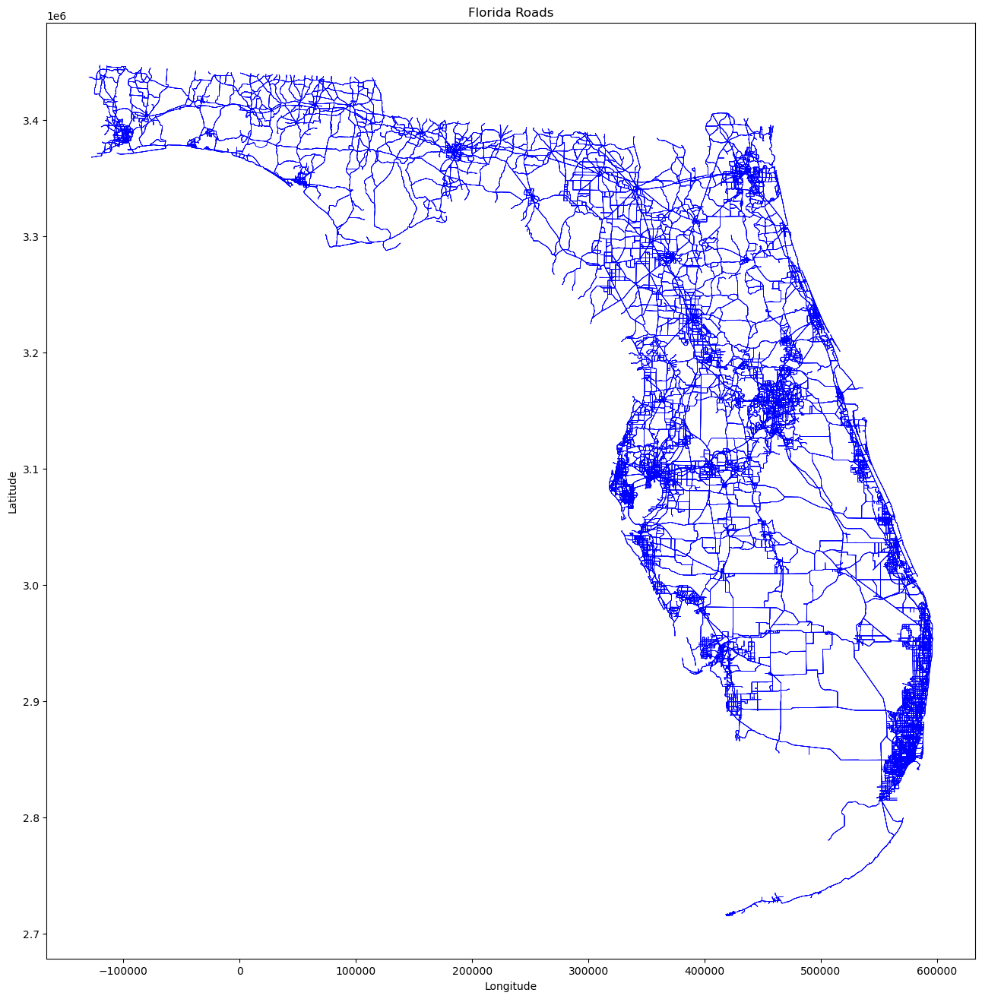

In [9]:
fig, ax = plt.subplots(figsize=(16, 16))
road_data.plot(ax=ax, linewidth=0.5, color='blue')
ax.set_title('Florida Roads')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

In [10]:
road_data['start_x'] = road_data['endpoints'].apply(lambda x: x[0][0] if x[0] is not None else None)
road_data['start_y'] = road_data['endpoints'].apply(lambda x: x[0][1] if x[0] is not None else None)
road_data['end_x'] = road_data['endpoints'].apply(lambda x: x[1][0] if x[1] is not None else None)
road_data['end_y'] = road_data['endpoints'].apply(lambda x: x[1][1] if x[1] is not None else None)

C:\Users\TeoDea\anaconda3\lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\TeoDea\anaconda3\lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\TeoDea\anaconda3\lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_index

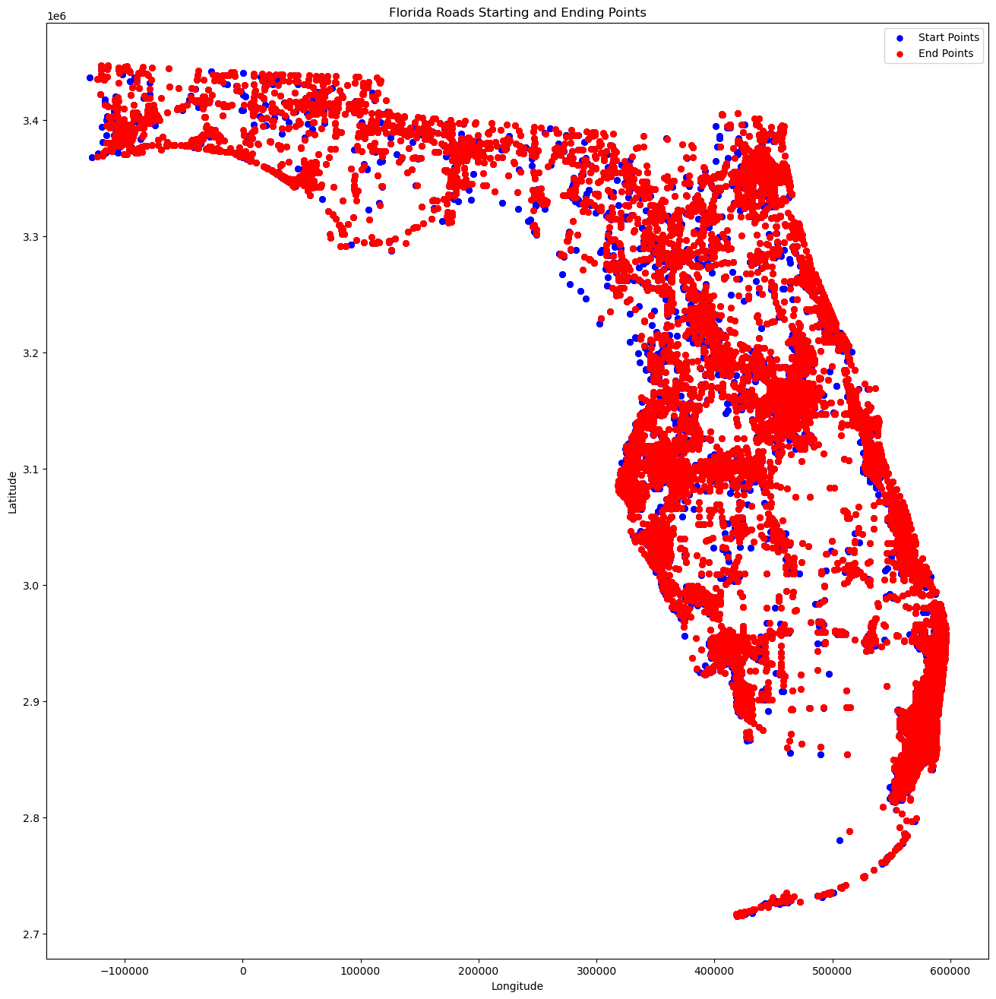

In [11]:
fig, ax = plt.subplots(figsize=(16, 16))
ax.scatter(road_data['start_x'], road_data['start_y'], color='blue', label='Start Points', linewidth=0.1)
ax.scatter(road_data['end_x'], road_data['end_y'], color='red', label='End Points', linewidth=0.1)
ax.set_title('Florida Roads Starting and Ending Points')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.legend()
plt.show()

In [12]:
def create_linestring(row):
    if None not in row['endpoints']:
        return LineString([row['endpoints'][0], row['endpoints'][1]])
    else:
        return None

In [13]:
road_data['line'] = road_data.apply(create_linestring, axis=1)

lines = gpd.GeoDataFrame(road_data, geometry='line')
lines = lines.dropna(subset=['line'])

C:\Users\TeoDea\anaconda3\lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


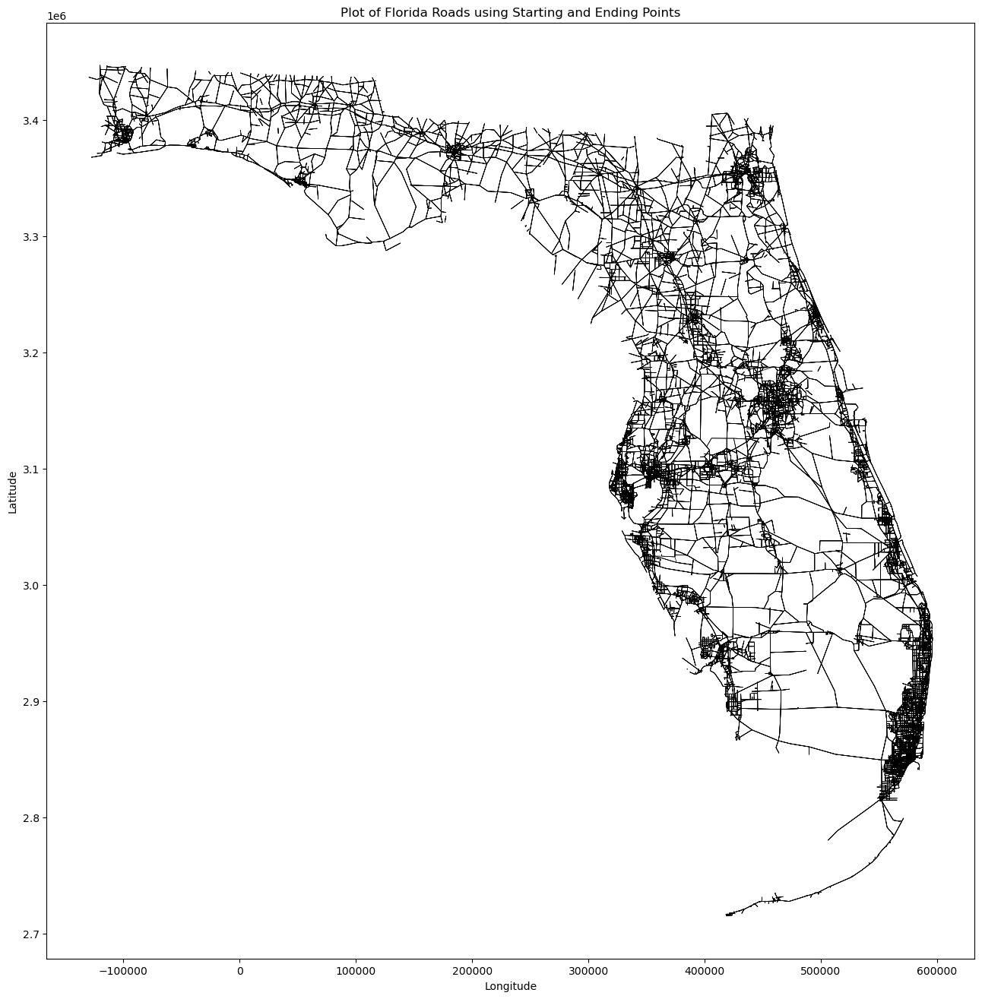

In [14]:
fig, ax = plt.subplots(figsize=(16, 16))
lines.plot(ax=ax, linewidth=0.5, color='black')
ax.set_title('Plot of Florida Roads using Starting and Ending Points')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

# Creating the Graph

In [15]:
# Extracting points to create unique nodes

points = set()
for line in lines.geometry:
    if line is not None:
        points.add(line.coords[0])
        points.add(line.coords[-1])

In [16]:
G = nx.Graph()   # Creating Graph

In [17]:
# Adding nodes

for point in points:
    G.add_node(point)

In [18]:
# Adding edges

for line in lines.geometry:
    if line is not None:
        start_point = line.coords[0]
        end_point = line.coords[-1]
        G.add_edge(start_point, end_point)

In [19]:
G.remove_edges_from(nx.selfloop_edges(G))    # Removing self-loops

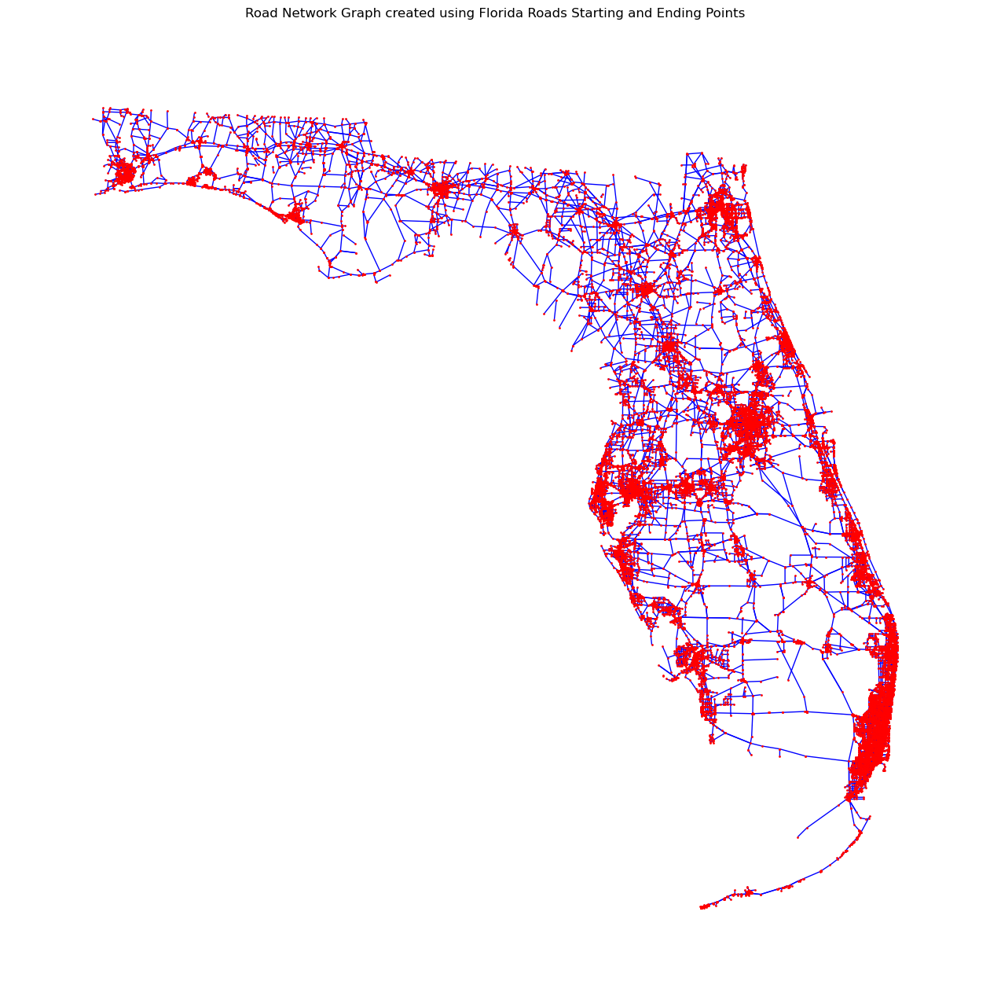

In [20]:
fig, ax = plt.subplots(figsize=(16, 16))
pos = {point: (point[0], point[1]) for point in points}
nx.draw(G, pos, with_labels=False, node_color='red', edge_color='blue', node_size=1, ax=ax)
ax.set_title('Road Network Graph created using Florida Roads Starting and Ending Points')
plt.show()

In [21]:
G = nx.MultiGraph()


for idx, line in lines.iterrows():
    if line['line'] is not None:
        start_point = line['line'].coords[0]
        end_point = line['line'].coords[-1]
        
        G.add_edge(
            start_point,
            end_point,
            key=line['YEAR_'],  # 'key' differentiates edges with the same nodes
            ROADWAY=line['ROADWAY'],
            BEGIN_POST=line['BEGIN_POST'],
            END_POST=line['END_POST'],
            Shape_Leng=line['Shape_Leng'],
            AADT=line['AADT'],
            YEAR_=line['YEAR_']
        )

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\994389462.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('Paired')   # RdYlGn_r or Paired


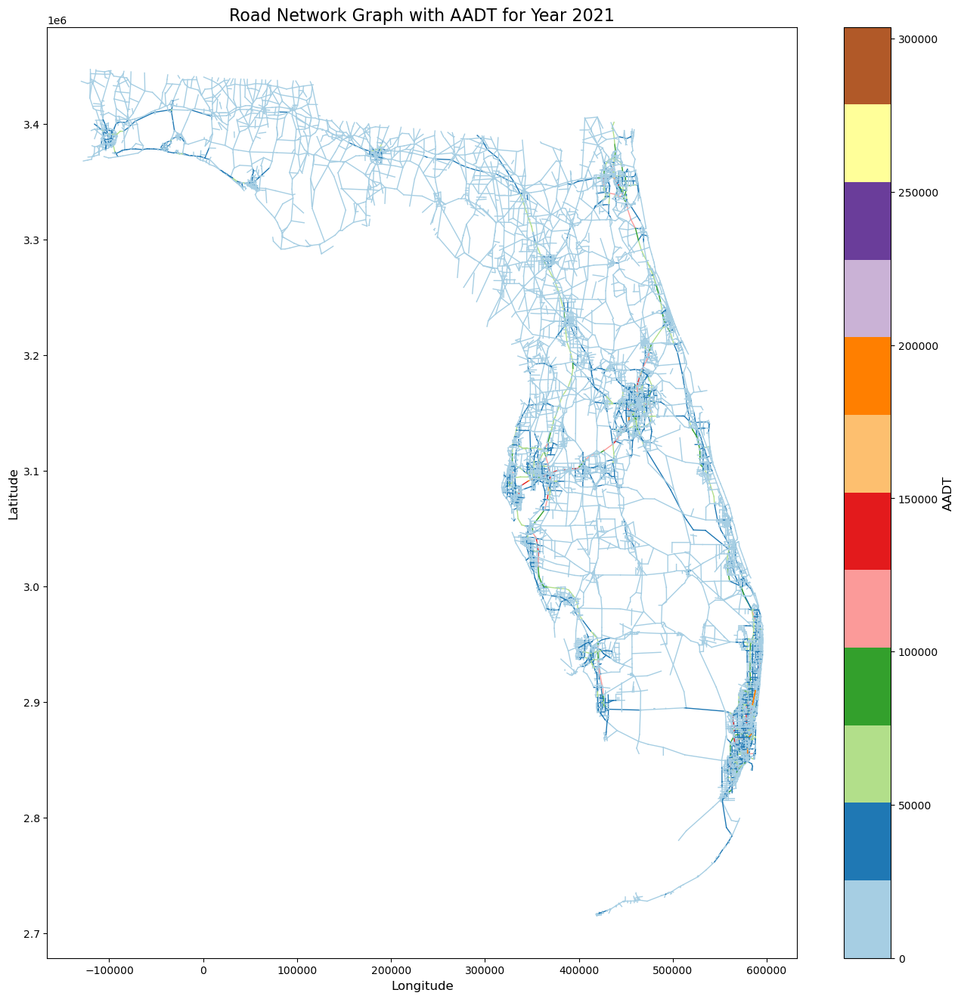

In [24]:
selected_year = 2021  # Change this to the desired year (2019, 2020, 2021, 2022, 2023)




def plot_graph_for_year(selected_year):
    edges = [
        (u, v, d) for u, v, key, d in G.edges(data=True, keys=True)
        if key == selected_year
    ]
    
    aadt_values = [d['AADT'] for _, _, d in edges]
    year_min_aadt = min(aadt_values)
    year_max_aadt = max(aadt_values)
    
    norm = Normalize(vmin=year_min_aadt, vmax=year_max_aadt)   # Set to 5000 and 10000 to see high vs low AADT 
    cmap = get_cmap('Paired')   # RdYlGn_r or Paired
    
    fig, ax = plt.subplots(figsize=(16, 16))
    pos = {node: node for node in G.nodes}
    for u, v, d in edges:
        aadt = d['AADT']
        color = cmap(norm(aadt))
        ax.plot(
            [u[0], v[0]],
            [u[1], v[1]],
            color=color,
            linewidth=1,
            alpha=1
        )
    
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('AADT', fontsize=12)
    
    ax.set_title(f'Road Network Graph with AADT for Year {selected_year}', fontsize=16)
    ax.set_xlabel('Longitude', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=12)
    
    plt.show()


    
    
plot_graph_for_year(selected_year)

# Temporal Change in Betweenness Centrality

In [57]:
def get_subgraph_for_year(G, year):
    """
    Extracts a single-edged subgraph for a specific year.
    """
    edges = [
        (u, v, d) for u, v, key, d in G.edges(data=True, keys=True)
        if key == year
    ]
    # Create a simple graph instead of a MultiGraph
    subgraph = nx.Graph()
    subgraph.add_edges_from((u, v, d) for u, v, d in edges)
    return subgraph

In [26]:
def compute_edge_betweenness(subgraph):
    """
    Computes edge betweenness centrality for a given subgraph.
    """
    centrality = nx.edge_betweenness_centrality(subgraph, normalized=True, weight=None)
    return centrality

In [45]:
def compute_temporal_changes(G, years):
    """
    Computes temporal changes in edge betweenness centrality.
    """
    betweenness_by_year = {}
    
    # Compute betweenness centrality for each year
    for year in years:
        subgraph = get_subgraph_for_year(G, year)
        print(f"Computing betweenness for year: {year}")
        start_time = time.time()
        betweenness_by_year[year] = compute_edge_betweenness(subgraph)
        end_time = time.time()
        print(f"Computed! Time taken: {end_time - start_time:.2f} seconds")
    
    # Compute changes between consecutive years
    changes = {}
    for i in range(len(years) - 1):
        year1, year2 = years[i], years[i + 1]
        changes[(year1, year2)] = {}
        
        for edge in betweenness_by_year[year1]:
            if edge in betweenness_by_year[year2]:  # Only compare edges present in both years
                change = (betweenness_by_year[year2][edge] - betweenness_by_year[year1][edge])
                changes[(year1, year2)][edge] = change
    
    return betweenness_by_year, changes

In [272]:
def plot_betweenness(G, betweenness, title):
    """
    Plots the graph with edges colored by betweenness centrality.
    """
    norm = Normalize(vmin=9.391305117913107e-09, vmax=6.508633892220894e-07)     #(vmin=min(betweenness.values()), vmax=max(betweenness.values()))
    cmap = plt.cm.get_cmap('coolwarm') 

    fig, ax = plt.subplots(figsize=(16, 16))

    for edge, centrality in betweenness.items():
        u, v = edge 
        color = cmap(norm(centrality)) #norm(centrality)
        ax.plot(
            [u[0], v[0]], [u[1], v[1]],
            color=color, linewidth=2, alpha=0.8
        )

    sm = ScalarMappable(cmap=cmap, norm=norm)  #cmap=cmap, norm=norm
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Betweenness Centrality', fontsize=12)

    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Longitude', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=12)

    plt.show()

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\604789477.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


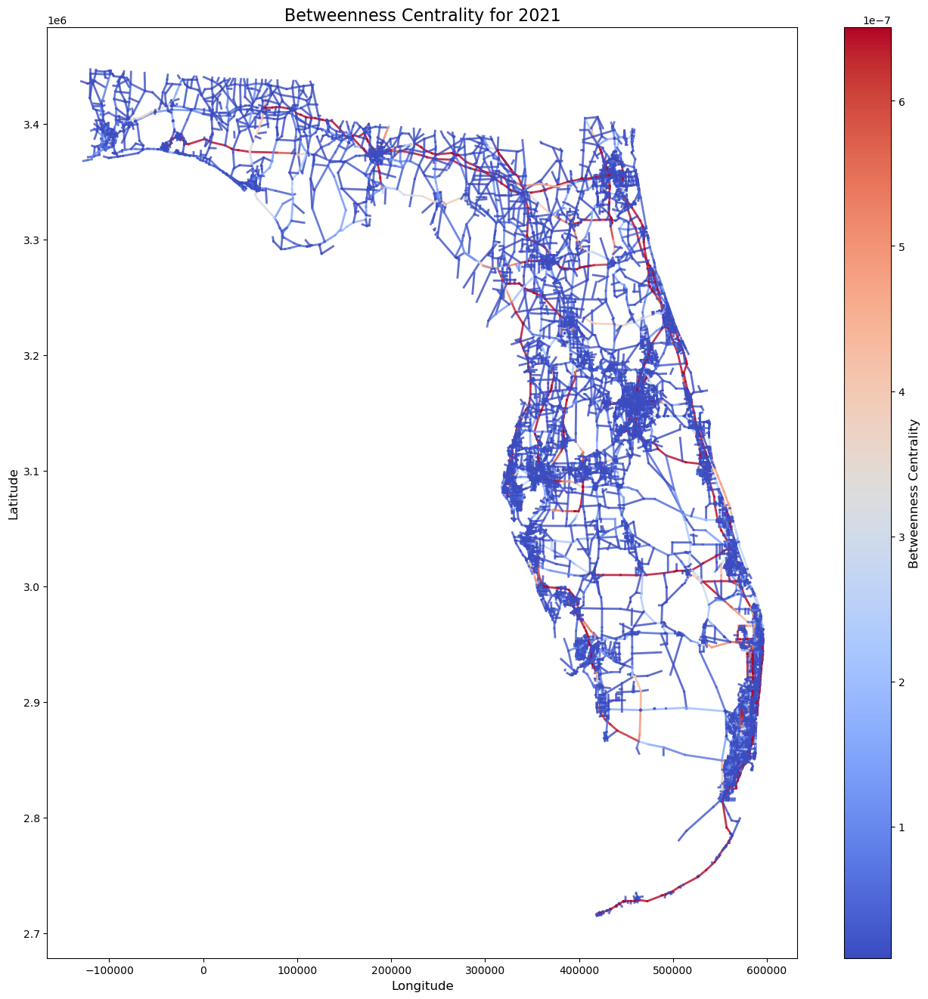

CPU times: total: 14.8 s
Wall time: 14.8 s


In [273]:
%%time

# Plot for single year

selected_year = 2021
plot_betweenness(get_subgraph_for_year(G, selected_year), betweenness_by_year_kgb[selected_year], f'Betweenness Centrality for {selected_year}')

In [234]:
def plot_changes(G, changes, year1, year2):
    """
    Plots the graph with edges colored by their betweenness centrality changes.
    """
    change_values = list(changes.values())
    norm = Normalize(vmin=9.391305117913107e-09, vmax=2.508633892220894e-07)
    cmap = plt.cm.get_cmap('coolwarm')

    fig, ax = plt.subplots(figsize=(16, 16))

    for edge, change in changes.items():
        u, v, key = edge
        color = cmap(norm(change))
        ax.plot(
            [u[0], v[0]], [u[1], v[1]],
            color=color, linewidth=2, alpha=0.8
        )

    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Change in Betweenness Centrality', fontsize=12)

    ax.set_title(f'Change in Betweenness Centrality: {year1} to {year2}', fontsize=16)
    ax.set_xlabel('Longitude', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=12)

    plt.show()

In [140]:
def save_betweenness_to_file(betweenness_by_year, filename):
    """
    Saves betweenness centrality data to a JSON file.
    Converts tuple keys to strings for JSON serialization.
    """
    serializable_data = {
        year: {str(edge): centrality for edge, centrality in edges.items()}
        for year, edges in betweenness_by_year.items()
    }
    with open(filename, "w") as file:
        json.dump(serializable_data, file)
    print(f"Betweenness centrality data saved to {filename}.")
    
    
def load_betweenness_from_file(filename="betweenness_centrality_kgb.json"):
    """
    Loads betweenness centrality data from a JSON file.
    Converts string keys back to tuples.
    """
    with open(filename, "r") as file:
        data = json.load(file)
    betweenness_by_year = {
        int(year): {eval(edge): centrality for edge, centrality in edges.items()}
        for year, edges in data.items()
    }
    print(f"Betweenness centrality data loaded from {filename}.")
    return betweenness_by_year

In [56]:
%%time

years = [2019, 2020, 2021, 2022, 2023]

#betweenness_by_year, changes = compute_temporal_changes(G, years)
#save_betweenness_to_file(betweenness_by_year)
betweenness_by_year = load_betweenness_from_file()

Betweenness centrality data loaded from betweenness_centrality.json.
CPU times: total: 1.55 s
Wall time: 1.54 s


C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\4235809577.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


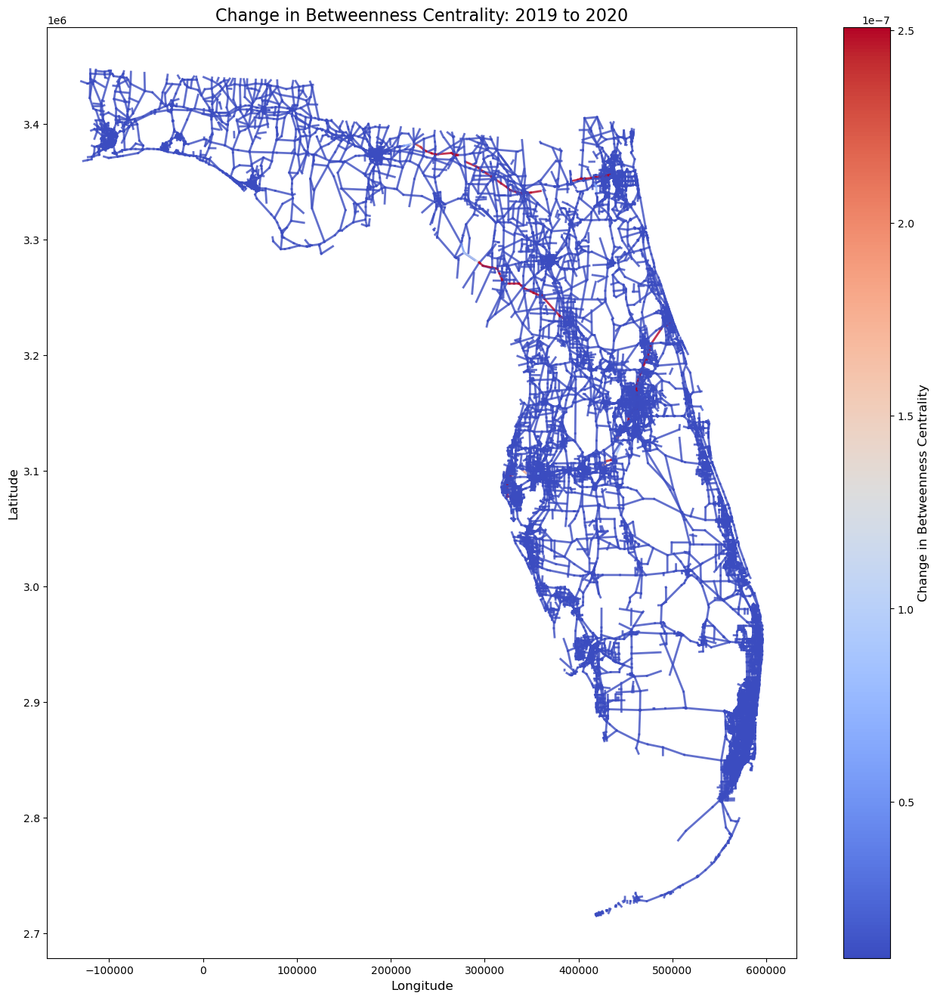

CPU times: total: 13 s
Wall time: 13.1 s


In [246]:
%%time

# Plot changes between two consecutive years

year1, year2 = 2019, 2020
plot_changes(get_subgraph_for_year(G, year1), changes[(year1, year2)], year1, year2)

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\4235809577.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


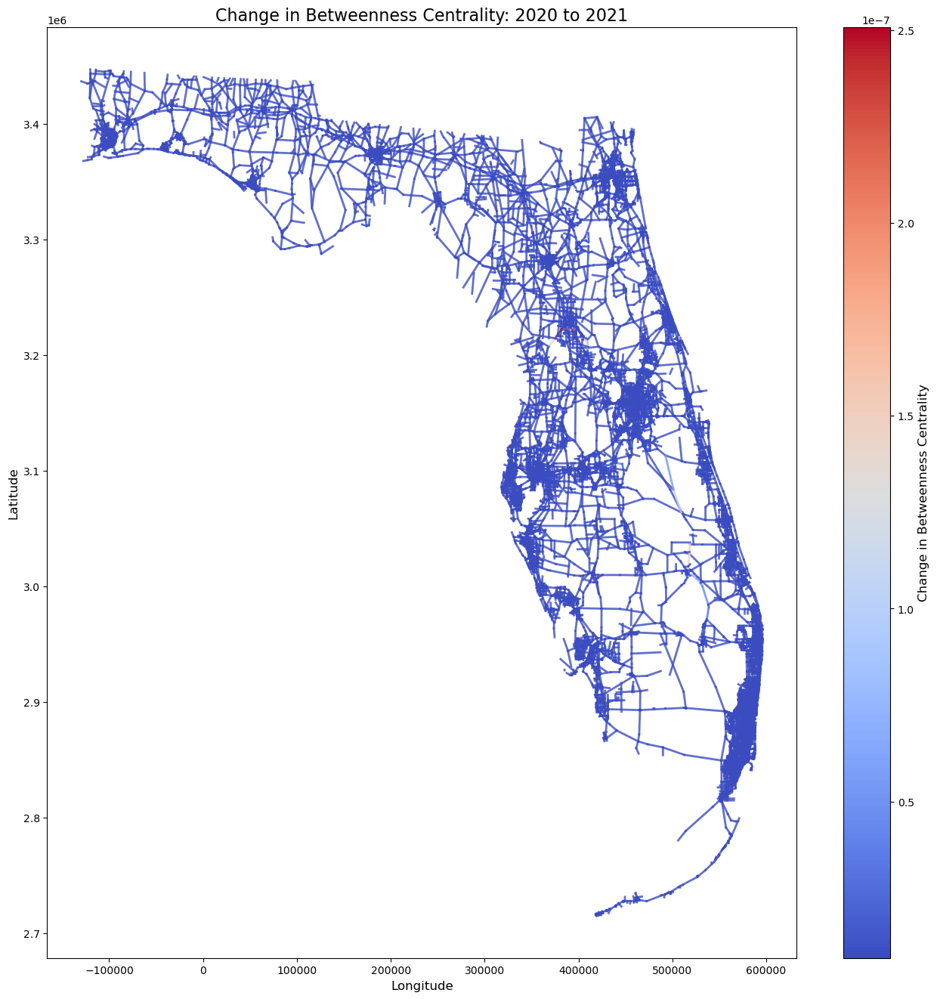

In [237]:
%%time

year1, year2 = 2020, 2021
plot_changes(get_subgraph_for_year(G, year1), changes[(year1, year2)], year1, year2)

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\4235809577.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


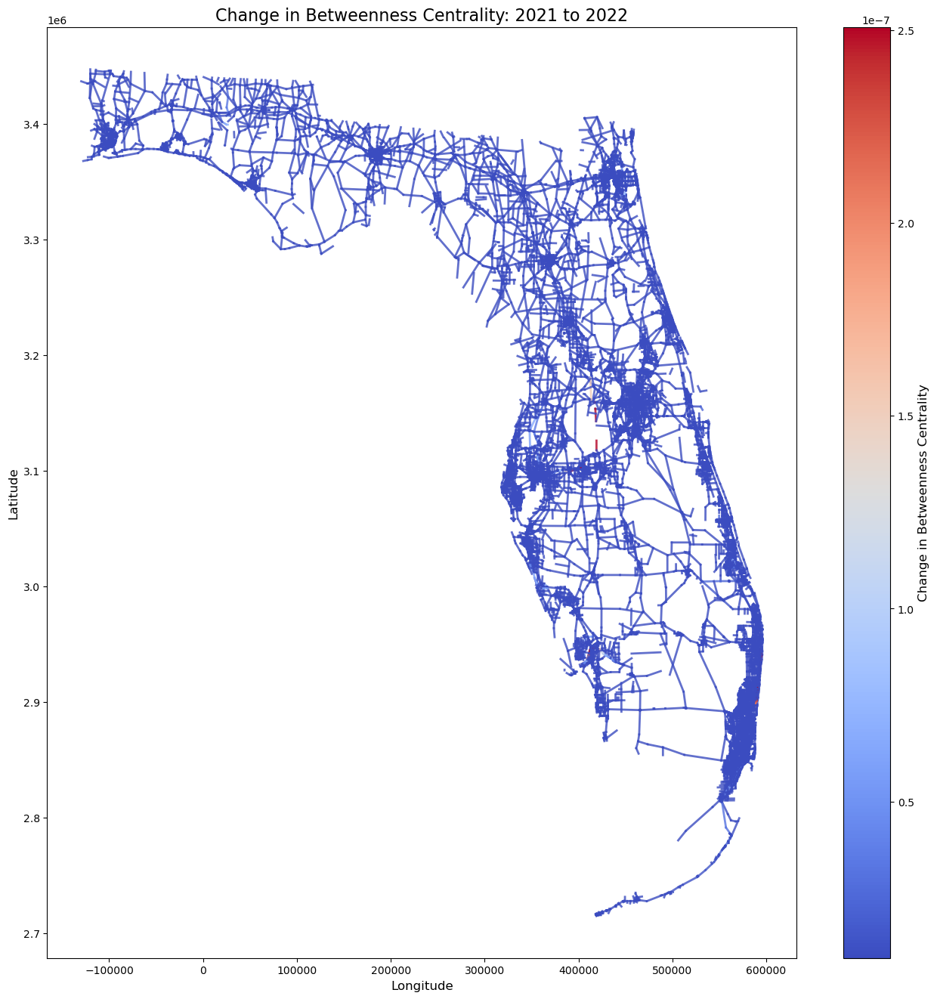

In [238]:
%%time

year1, year2 = 2021, 2022
plot_changes(get_subgraph_for_year(G, year1), changes[(year1, year2)], year1, year2)

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\4235809577.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


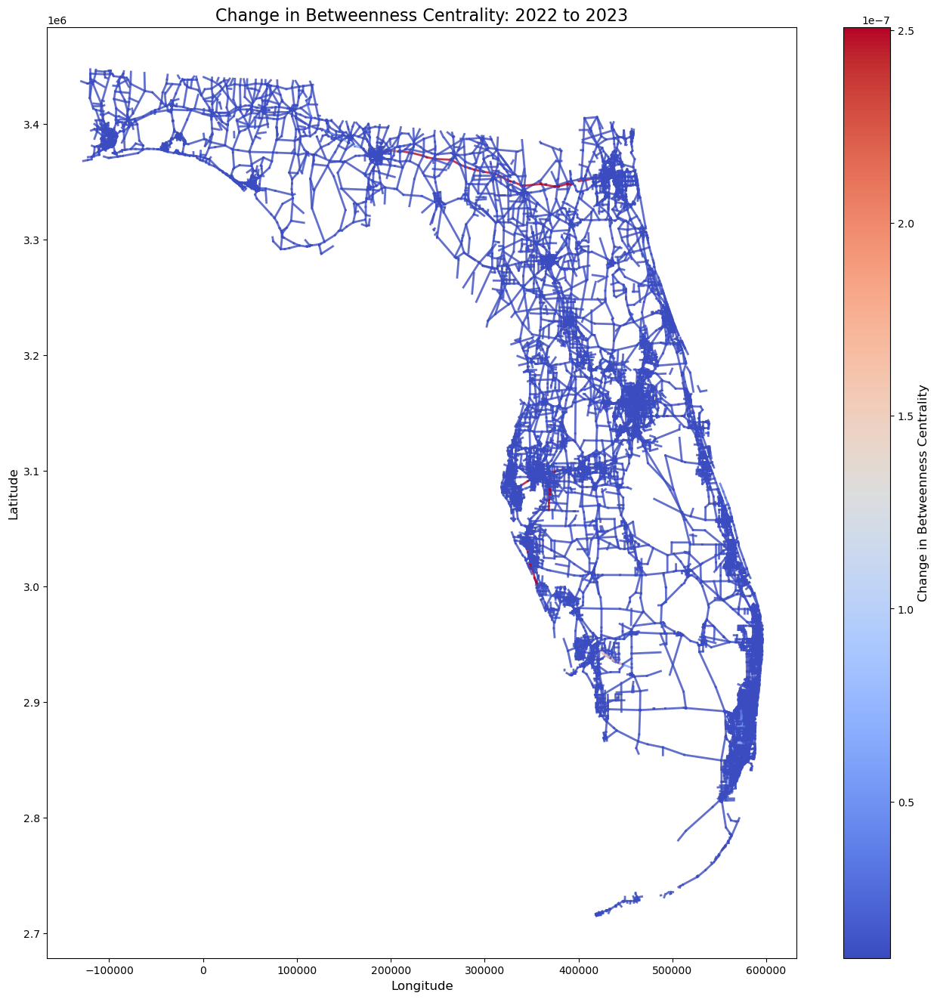

In [239]:
%%time

year1, year2 = 2022, 2023
plot_changes(get_subgraph_for_year(G, year1), changes[(year1, year2)], year1, year2)

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\1723632859.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


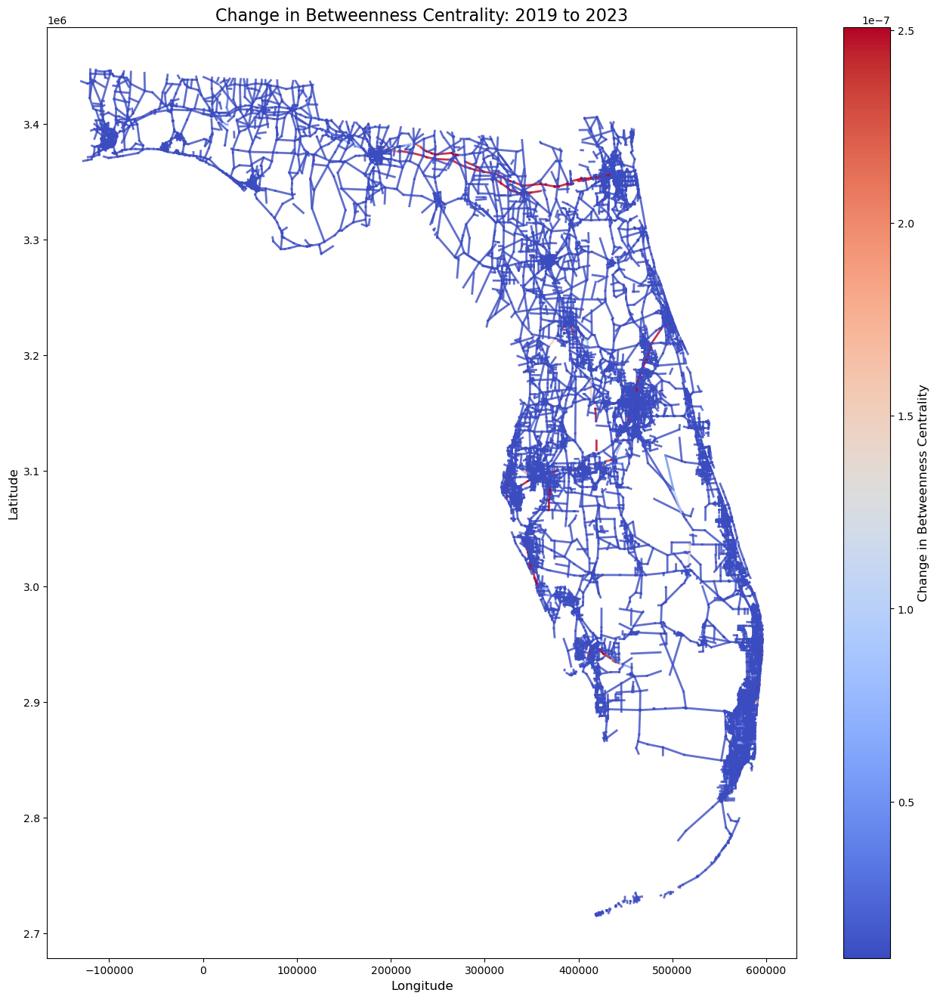

CPU times: total: 13 s
Wall time: 13.1 s


In [263]:
%%time

year1, year2 = 2019, 2023
plot_changes_with_aadt(get_subgraph_for_year(G, year1), changes_19_23[(year1, year2)], year1, year2)

In [252]:
print(changes.keys())

dict_keys([(2019, 2020), (2020, 2021), (2021, 2022), (2022, 2023)])


In [257]:
print(changes_19_23.keys())

dict_keys([(2019, 2020), (2020, 2021), (2021, 2022), (2022, 2023)])


In [260]:
%%time

# Compute changes between consecutive years
year1, year2 = 2019, 2023

changes_19_23 = {}

changes_19_23[(year1, year2)] = {}

for edge in betweenness_by_year_with_aadt[year1]:
    if edge in betweenness_by_year_with_aadt[year2]:  # Only compare edges present in both years
        change = (betweenness_by_year_with_aadt[year2][edge] - betweenness_by_year_with_aadt[year1][edge])
        changes_19_23[(year1, year2)][edge] = change

CPU times: total: 46.9 ms
Wall time: 41.6 ms


In [262]:
def plot_changes_with_aadt(G, changes, year1, year2):
    """
    Plots the graph with edges colored by their betweenness centrality changes.
    """
    change_values = list(changes_19_23.values())
    norm = Normalize(vmin=9.391305117913107e-09, vmax=2.508633892220894e-07)
    cmap = plt.cm.get_cmap('coolwarm')

    fig, ax = plt.subplots(figsize=(16, 16))

    for edge, change in changes.items():
        u, v = edge
        color = cmap(norm(change))
        ax.plot(
            [u[0], v[0]], [u[1], v[1]],
            color=color, linewidth=2, alpha=0.8
        )

    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Change in Betweenness Centrality', fontsize=12)

    ax.set_title(f'Change in Betweenness Centrality: {year1} to {year2}', fontsize=16)
    ax.set_xlabel('Longitude', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=12)

    plt.show()

In [58]:
%%time

# Testing with new get_subgraph function that creates single edge only:

#b_c_y, c = compute_temporal_changes(G, years)

Computing betweenness for year: 2019
Computed! Time taken: 1494.51 seconds
Computing betweenness for year: 2020
Computed! Time taken: 1486.12 seconds
Computing betweenness for year: 2021
Computed! Time taken: 1632.98 seconds
Computing betweenness for year: 2022
Computed! Time taken: 1616.65 seconds
Computing betweenness for year: 2023
Computed! Time taken: 3000.26 seconds
CPU times: total: 2h 8min 46s
Wall time: 2h 33min 51s


In [60]:
#save_betweenness_to_file(b_c_y)

Betweenness centrality data saved to betweenness_centrality_kgb.json.


In [63]:
betweenness_by_year_kgb = load_betweenness_from_file()

Betweenness centrality data loaded from betweenness_centrality_kgb.json.


In [104]:
import numpy as np

# Find the minimum, maximum, median, and average edge betweenness centrality values
min_value = float('inf')
max_value = float('-inf')
min_edge = None
max_edge = None
all_centrality_values = []  # To store all centrality values for median and average calculation

# Iterate through all years and edges to find global min, max, and collect all values
for year, edges in betweenness_by_year_kgb.items():
    for edge, centrality in edges.items():
        all_centrality_values.append(centrality)  # Collect centrality values
        if centrality < min_value:
            min_value = centrality
            min_edge = (year, edge)
        if centrality > max_value:
            max_value = centrality
            max_edge = (year, edge)

# Calculate median and average
median_value = np.median(all_centrality_values)
average_value = np.mean(all_centrality_values)

# Print the results
print(f"Minimum edge betweenness centrality: {min_value}")
print(f"Found in year {min_edge[0]} for edge {min_edge[1]}")
print(f"Maximum edge betweenness centrality: {max_value}")
print(f"Found in year {max_edge[0]} for edge {max_edge[1]}")
print(f"Median edge betweenness centrality: {median_value}")
print(f"Average edge betweenness centrality: {average_value}")


Minimum edge betweenness centrality: 0.0
Found in year 2019 for edge ((570762.1873000003, 3015244.4996000007), (570762.1873000003, 3015244.4996000007))
Maximum edge betweenness centrality: 7.908633892220894e-06
Found in year 2019 for edge ((157067.4709999999, 3389408.5918000005), (158636.99110000022, 3388358.007099999))
Median edge betweenness centrality: 9.391305117913107e-09
Average edge betweenness centrality: 1.6225191141435307e-07


In [129]:
import heapq

# Find the top 10 largest edge betweenness centralities
top_10_centralities = heapq.nlargest(100, all_centrality_values)

print(f"Top 10 largest edge betweenness centralities: {top_10_centralities}")


Top 10 largest edge betweenness centralities: [7.908633892220894e-06, 7.908633892220894e-06, 7.903849479702913e-06, 7.894280654666954e-06, 7.879927417113014e-06, 7.860789767041093e-06, 7.836867704451194e-06, 7.808161229343314e-06, 7.774670341717453e-06, 7.761913679955183e-06, 7.761913679955183e-06, 7.757218027396225e-06, 7.751817746745653e-06, 7.751817746745653e-06, 7.747826722278313e-06, 7.74712820182929e-06, 7.737749111996568e-06, 7.736395041573614e-06, 7.733739764601443e-06, 7.723680477247482e-06, 7.714957154365618e-06, 7.704922297582037e-06, 7.693335328911794e-06, 7.691478891570835e-06, 7.68147457300023e-06, 7.663304976217096e-06, 7.65974797112252e-06, 7.65974797112252e-06, 7.6551141248e-06, 7.65333730350206e-06, 7.645846432154964e-06, 7.645491203731995e-06, 7.63194489318741e-06, 7.630435408304399e-06, 7.6205104890875285e-06, 7.613409507897337e-06, 7.61200197475501e-06, 7.61200197475501e-06, 7.607397012882805e-06, 7.598187089138395e-06, 7.592870187832747e-06, 7.592862666034215e-06,

In [145]:
def compute_edge_betweenness_with_weights(subgraph, weight=None):
    """
    Computes edge betweenness centrality for a given subgraph.
    Allows specifying a weight attribute for the edges.
    """
    # Compute edge betweenness centrality, using weights if provided
    centrality = nx.edge_betweenness_centrality(subgraph, normalized=True, weight=weight)
    return centrality

In [147]:
def compute_temporal_changes_with_weights(G, years, weight=None):
    """
    Computes temporal changes in edge betweenness centrality with optional weights.
    """
    betweenness_by_year = {}

    for year in years:
        subgraph = get_subgraph_for_year(G, year)
        print(f"Computing betweenness for year: {year} with weight: {weight}")
        start_time = time.time()
        betweenness_by_year[year] = compute_edge_betweenness_with_weights(subgraph, weight=weight)
        end_time = time.time()
        print(f"Computed! Time taken: {end_time - start_time:.2f} seconds")

    # Compute changes between consecutive years
    changes = {}
    for i in range(len(years) - 1):
        year1, year2 = years[i], years[i + 1]
        changes[(year1, year2)] = {}

        for edge in betweenness_by_year[year1]:
            if edge in betweenness_by_year[year2]:
                change = betweenness_by_year[year2][edge] - betweenness_by_year[year1][edge]
                changes[(year1, year2)][edge] = change

    return betweenness_by_year, changes


In [148]:
%%time

# Using AADT as weights

betweenness_by_year_with_aadt, changes_with_aadt = compute_temporal_changes_with_weights(G, years, weight='AADT')

Computing betweenness for year: 2019 with weight: AADT
Computed! Time taken: 1426.31 seconds
Computing betweenness for year: 2020 with weight: AADT
Computed! Time taken: 1551.44 seconds
Computing betweenness for year: 2021 with weight: AADT
Computed! Time taken: 1467.72 seconds
Computing betweenness for year: 2022 with weight: AADT
Computed! Time taken: 1486.02 seconds
Computing betweenness for year: 2023 with weight: AADT
Computed! Time taken: 1537.11 seconds
CPU times: total: 2h 3min 42s
Wall time: 2h 4min 29s


In [149]:
save_betweenness_to_file(betweenness_by_year_with_aadt, "betweenness_by_year_with_aadt")

Betweenness centrality data saved to betweenness_by_year_with_aadt.


In [150]:
%%time

# Using Shape_Leng as weights

betweenness_by_year_with_shape_len, changes_with_shape_len = compute_temporal_changes_with_weights(G, years, weight='Shape_Leng')

Computing betweenness for year: 2019 with weight: Shape_Leng
Computed! Time taken: 1434.62 seconds
Computing betweenness for year: 2020 with weight: Shape_Leng
Computed! Time taken: 1483.46 seconds
Computing betweenness for year: 2021 with weight: Shape_Leng
Computed! Time taken: 1471.39 seconds
Computing betweenness for year: 2022 with weight: Shape_Leng
Computed! Time taken: 1487.23 seconds
Computing betweenness for year: 2023 with weight: Shape_Leng
Computed! Time taken: 1496.58 seconds
CPU times: total: 2h 2min 3s
Wall time: 2h 2min 54s


In [151]:
save_betweenness_to_file(betweenness_by_year_with_shape_len, "betweenness_by_year_with_shape_len")

Betweenness centrality data saved to betweenness_by_year_with_shape_len.


C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\69227149.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


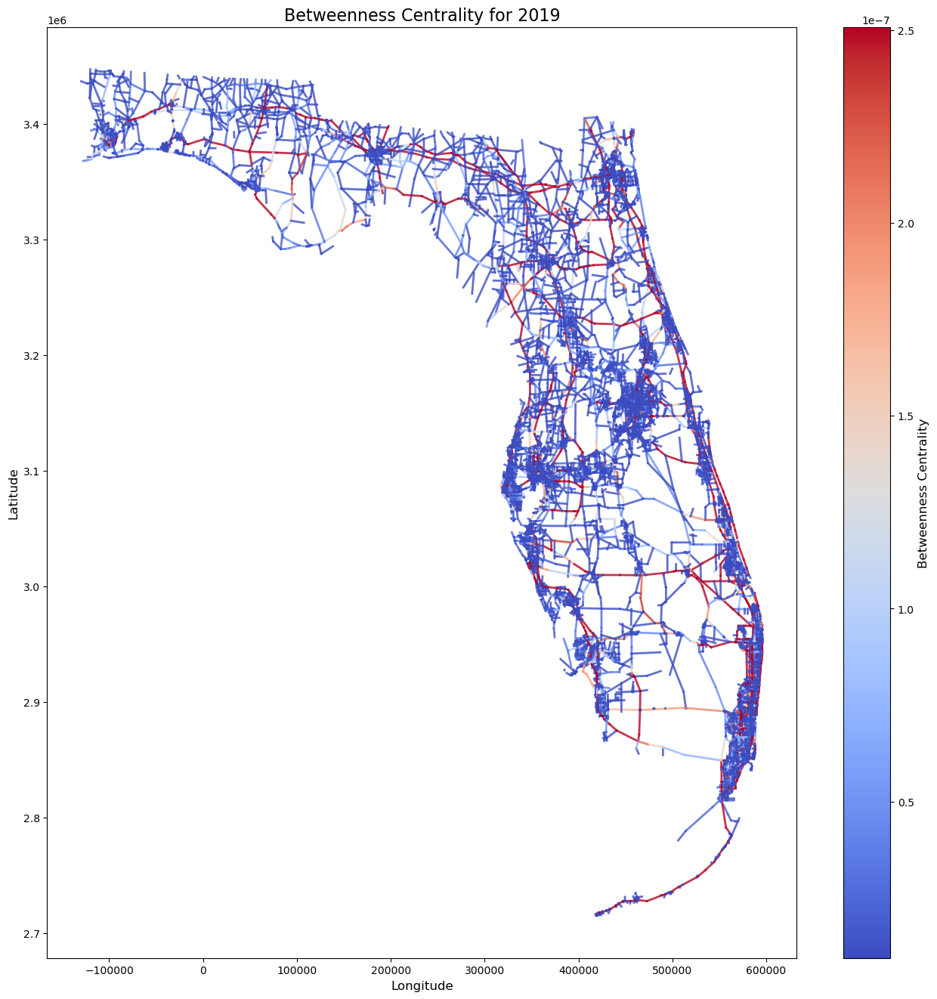

In [152]:
%%time

selected_year = 2019
plot_betweenness(get_subgraph_for_year(G, selected_year), betweenness_by_year_with_aadt[selected_year], f'Betweenness Centrality for {selected_year}')

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\69227149.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


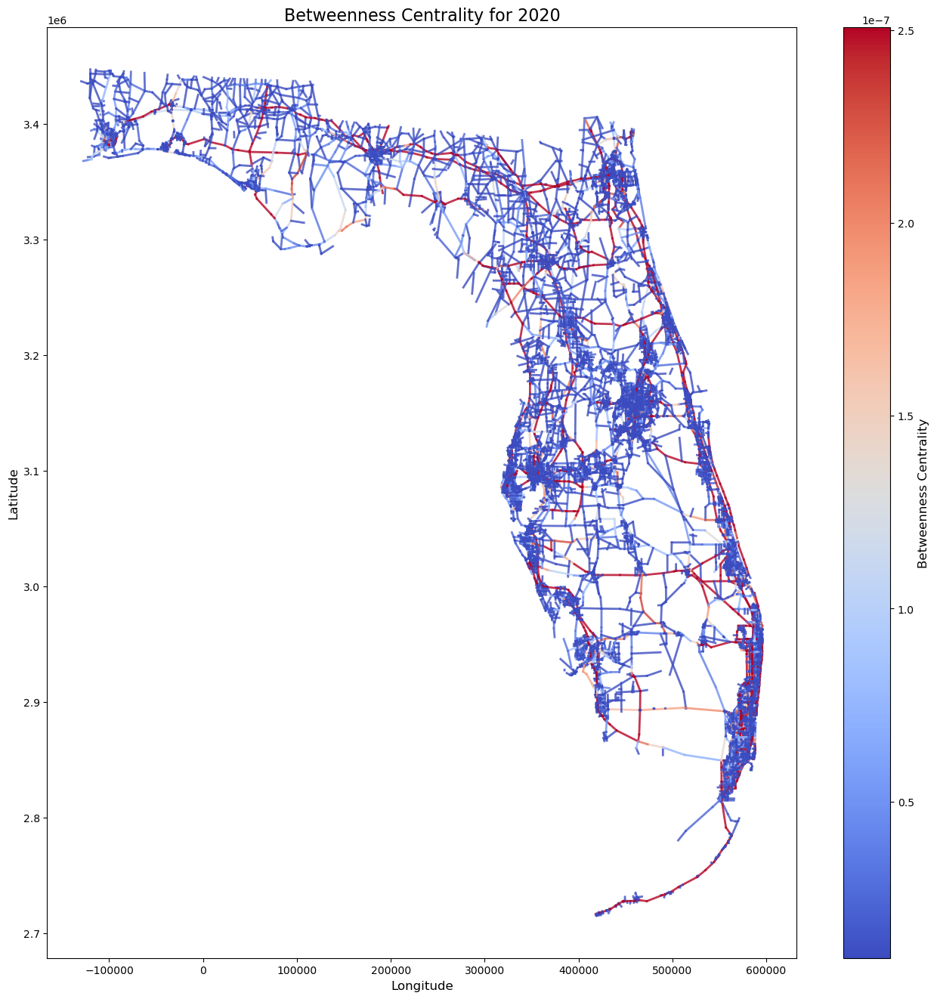

In [240]:
%%time

selected_year = 2020
plot_betweenness(get_subgraph_for_year(G, selected_year), betweenness_by_year_with_aadt[selected_year], f'Betweenness Centrality for {selected_year}')

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\69227149.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


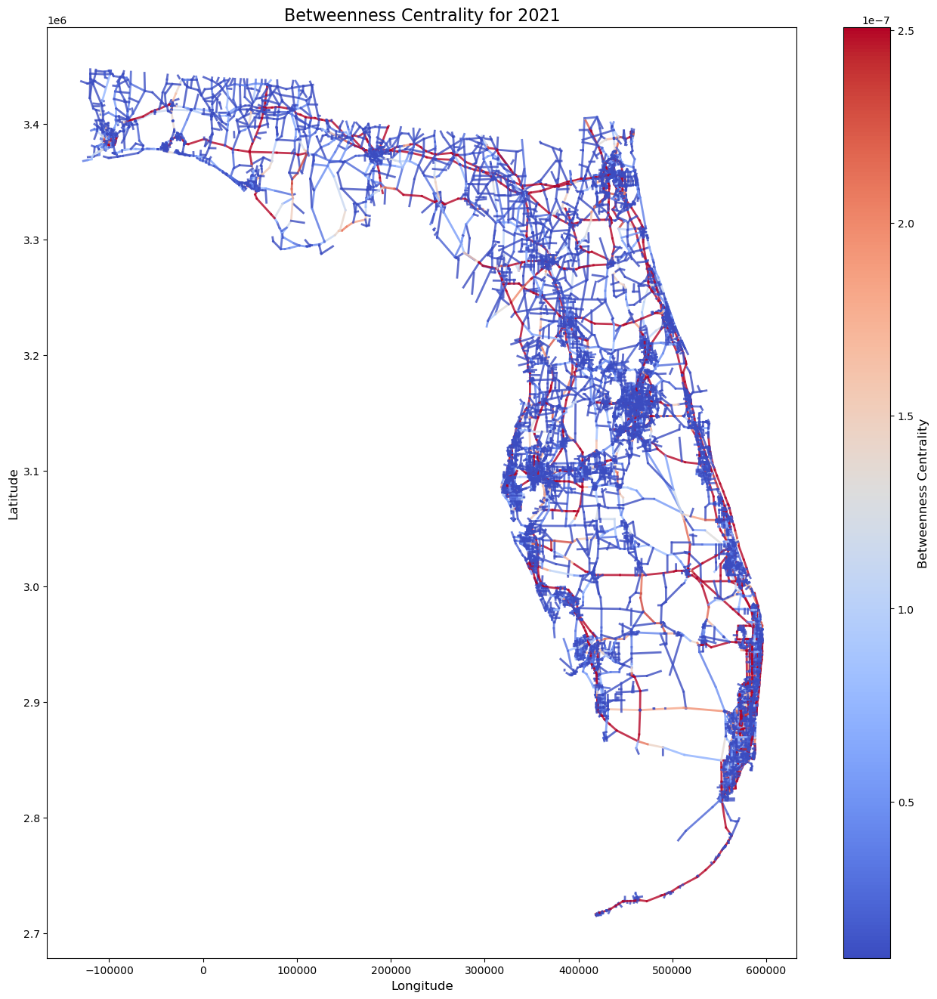

In [242]:
%%time

selected_year = 2021
plot_betweenness(get_subgraph_for_year(G, selected_year), betweenness_by_year_with_aadt[selected_year], f'Betweenness Centrality for {selected_year}')

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\69227149.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


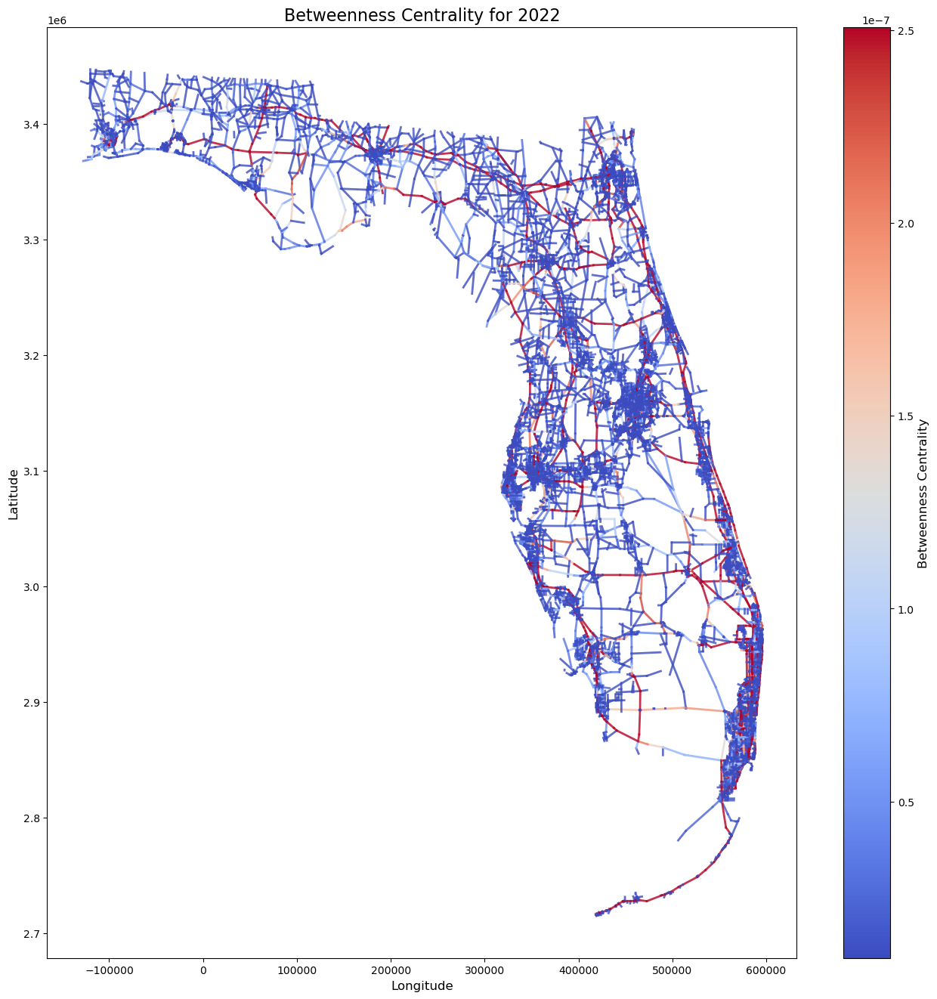

In [243]:
%%time

selected_year = 2022
plot_betweenness(get_subgraph_for_year(G, selected_year), betweenness_by_year_with_aadt[selected_year], f'Betweenness Centrality for {selected_year}')

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\69227149.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


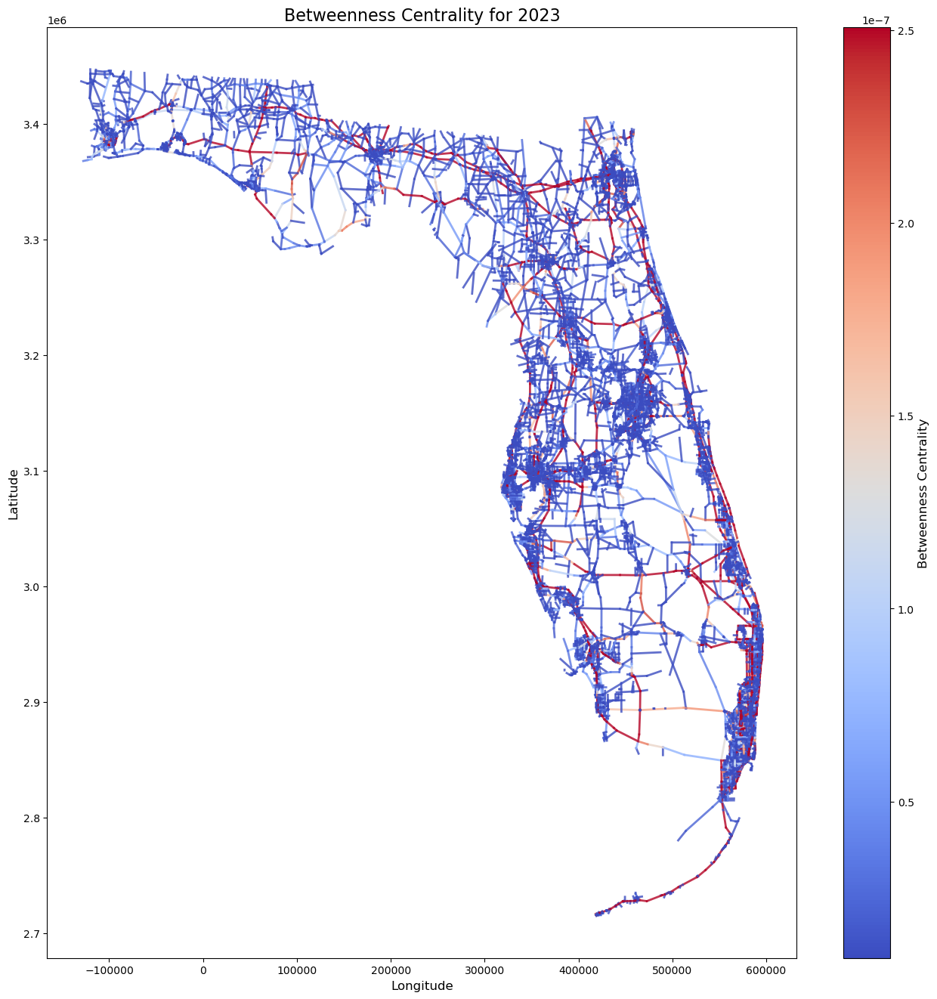

In [244]:
%%time

selected_year = 2023
plot_betweenness(get_subgraph_for_year(G, selected_year), betweenness_by_year_with_aadt[selected_year], f'Betweenness Centrality for {selected_year}')

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\69227149.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm')


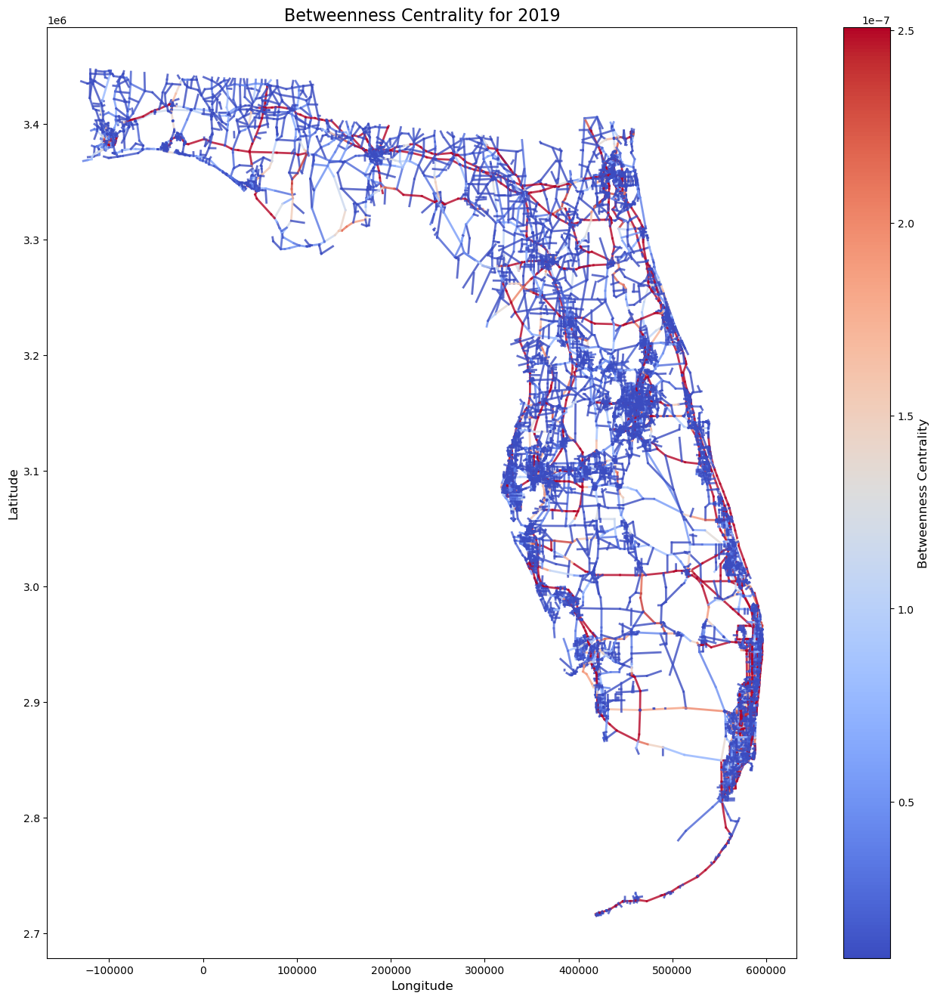

In [153]:
selected_year = 2019
plot_betweenness(get_subgraph_for_year(G, selected_year), betweenness_by_year_with_shape_len[selected_year], f'Betweenness Centrality for {selected_year}')

## Cluster and Community Detection

In [177]:
def detect_communities_louvain(G, weight=None, resolution=1.0):
    """
    Detects communities in a graph using the Louvain method.
    Parameters:
        G: The input graph (nx.Graph or nx.MultiGraph).
        weight: The edge weight attribute to consider (e.g., 'AADT', 'Shape_Leng').
    Returns:
        communities: A dictionary mapping each node to its community.
    """
    # Convert MultiGraph to Graph for community detection
    if isinstance(G, nx.MultiGraph):
        G = nx.Graph(G)

    # Add edge weights (if specified) to the graph
    if weight:
        for u, v, data in G.edges(data=True):
            data['weight'] = data.get(weight, 1.0)
    
    # Apply Louvain method
    communities = community_louvain.best_partition(G, weight='weight' if weight else None, resolution=resolution)
    return communities


In [163]:

def plot_communities(G, communities, title="Graph Communities"):
    """
    Plots the graph with nodes colored by community.
    Parameters:
        G: The input graph.
        communities: A dictionary mapping nodes to community IDs.
        title: Title of the plot.
    """
    # Assign community IDs as node colors
    node_colors = [communities[node] for node in G.nodes()]
    pos = {node: node for node in G.nodes()}  # Node positions (coordinates)

    # Draw the graph
    plt.figure(figsize=(16, 16))
    nx.draw(
        G, pos,
        node_color=node_colors,
        with_labels=False,
        node_size=30,
        cmap=plt.cm.tab10,
        edge_color="gray",
        alpha=0.6
    )
    plt.title(title, fontsize=16)
    plt.show()



In [274]:
# Example usage
selected_year = 2021
subgraph = get_subgraph_for_year(G, selected_year)


subgraph.remove_edges_from(nx.selfloop_edges(subgraph)) 

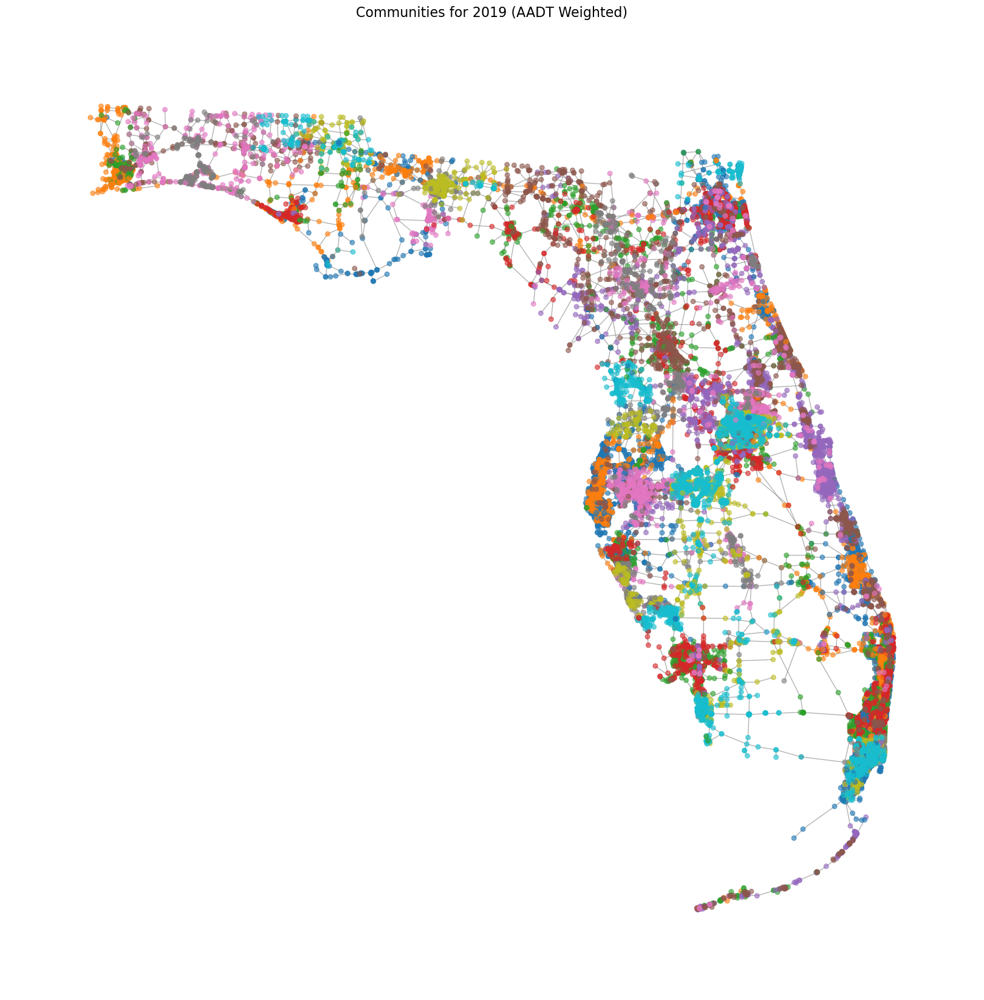

In [174]:
# Detect communities using AADT as weight
communities = detect_communities_louvain(subgraph, weight='AADT') #AADT or Shape_Len

# Plot the communities
plot_communities(subgraph, communities, title=f"Communities for {selected_year} (AADT Weighted)")

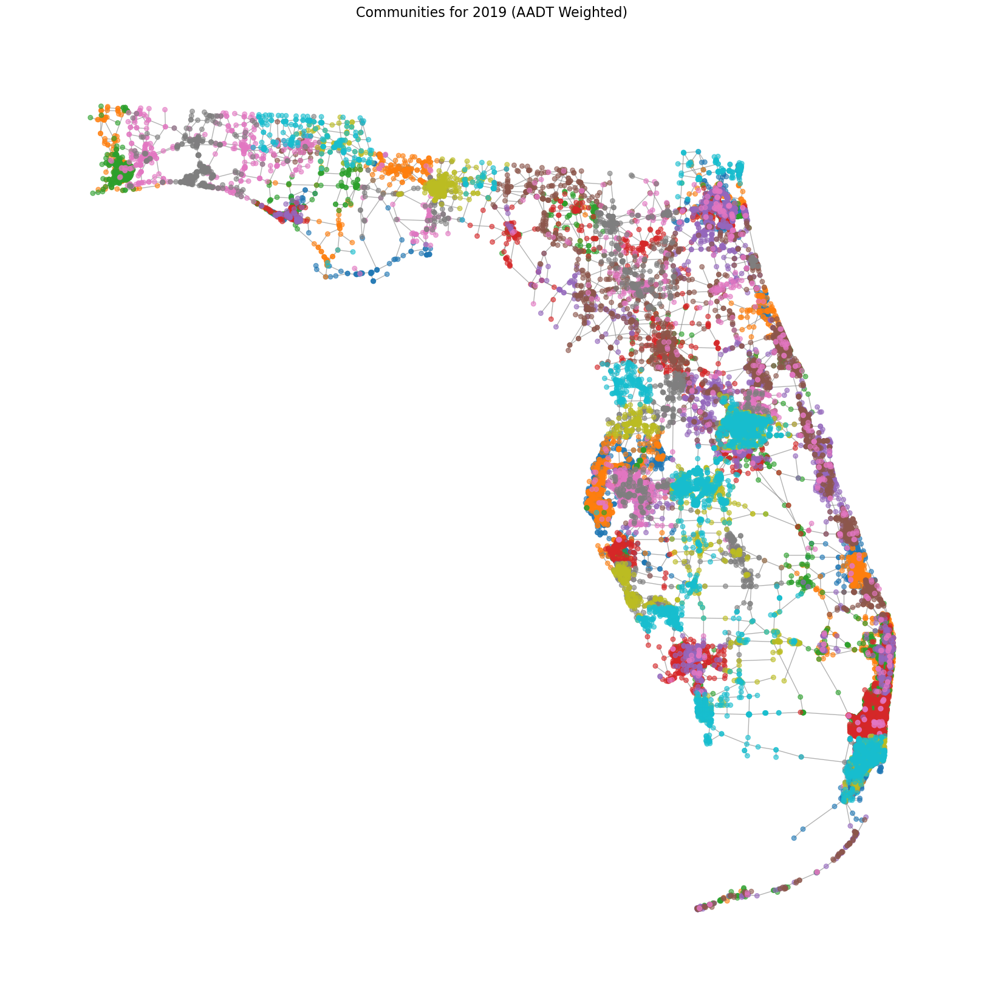

In [184]:
communities_high_res = detect_communities_louvain(subgraph, weight='AADT', resolution=100.0)

plot_communities(subgraph, communities_high_res, title=f"Communities for {selected_year} (AADT Weighted)")

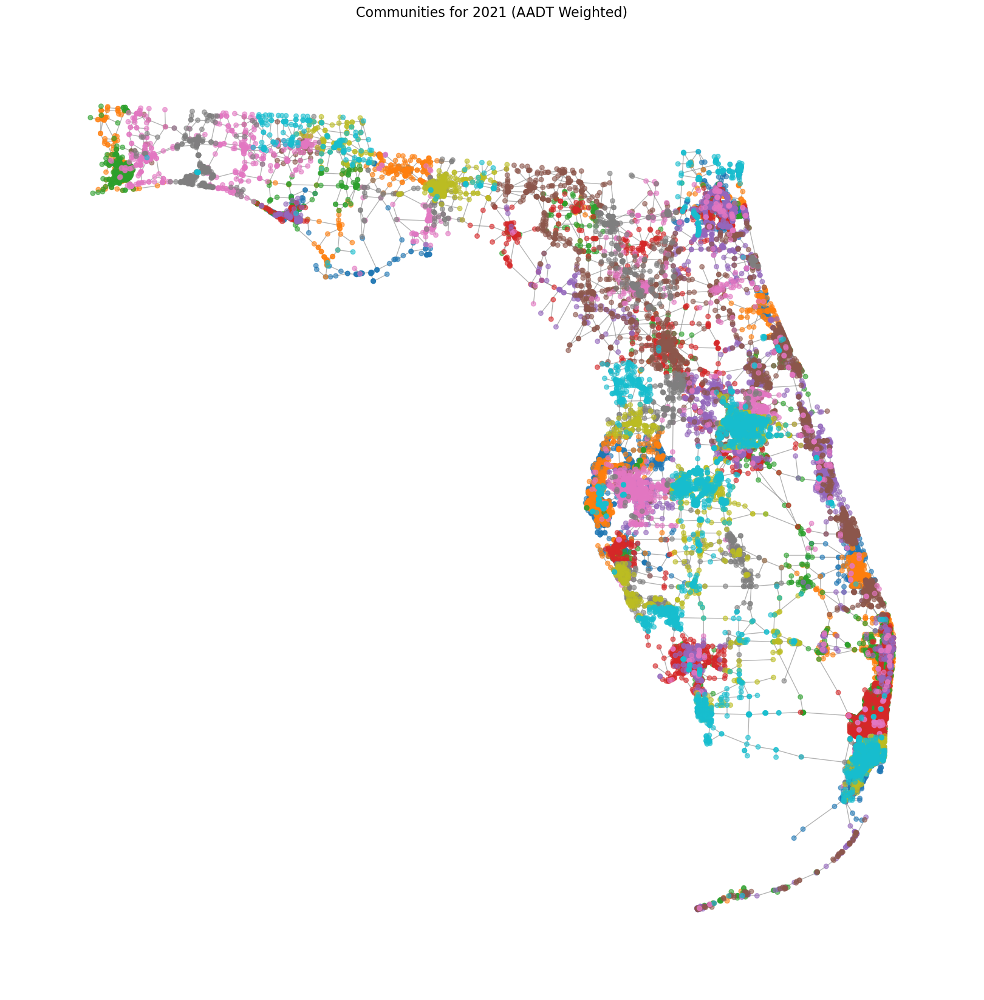

In [276]:
communities_high_res = detect_communities_louvain(subgraph, weight='AADT', resolution=100000000000.0)

plot_communities(subgraph, communities_high_res, title=f"Communities for {selected_year} (AADT Weighted)")

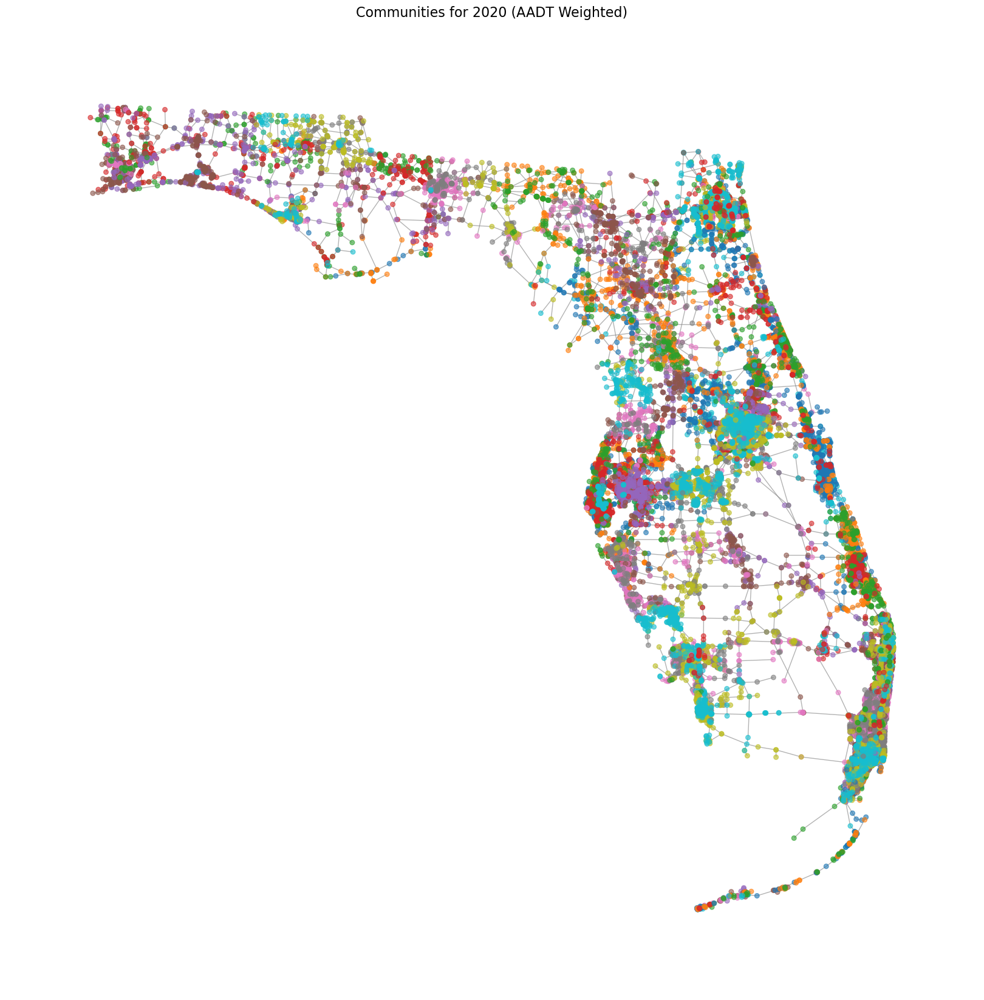

In [193]:
communities_low_res = detect_communities_louvain(subgraph, weight='AADT', resolution=0.00001)

plot_communities(subgraph, communities_low_res, title=f"Communities for {selected_year} (AADT Weighted)")

In [198]:
def print_community_colors(G, communities):
    """
    Prints the community IDs and their corresponding colors.
    Parameters:
        G: The input graph.
        communities: A dictionary mapping nodes to community IDs.
    """
    # Assign unique colors to communities
    unique_communities = list(set(communities.values()))
    community_to_color = {cid: idx for idx, cid in enumerate(unique_communities)}  # Map community ID to a color index

    # Print the mapping of communities to colors
    print("Community Color Mapping:")
    for cid in unique_communities:
        color_index = community_to_color[cid] / len(unique_communities)
        print(f"Community {cid}: Color index {color_index}")


In [225]:
from collections import defaultdict

def analyze_aadt_by_community(G, communities):
    """
    Analyzes AADT values for each community and identifies which communities
    are associated with larger or smaller AADT data.
    """
    # Group nodes by community
    community_aadt = defaultdict(list)

    for u, v, data in G.edges(data=True):
        aadt = data.get('AADT', 0)  # Get AADT value
        community_u = communities.get(u)
        community_v = communities.get(v)
        
        # Assign the edge's AADT value to the corresponding communities
        if community_u is not None:
            community_aadt[community_u].append(aadt)
        if community_v is not None:
            community_aadt[community_v].append(aadt)

    # Calculate summary statistics for each community
    community_stats = {}
    for community, aadt_values in community_aadt.items():
        if aadt_values:  # Avoid empty lists
            community_stats[community] = {
                'mean_aadt': sum(aadt_values) / len(aadt_values),
                'median_aadt': sorted(aadt_values)[len(aadt_values) // 2],
                'max_aadt': max(aadt_values),
                'min_aadt': min(aadt_values),
                'total_aadt': sum(aadt_values),
                'count_edges': len(aadt_values)
            }

    # Sort communities by mean AADT
    sorted_communities = sorted(community_stats.items(), key=lambda x: x[1]['mean_aadt'], reverse=True)

    # Print the results
#     print("Community AADT Analysis (Ranked by Mean AADT):")
#     for community, stats in sorted_communities:
#         print(f"Community {community}: Mean AADT = {stats['mean_aadt']:.2f}, "
#               f"Median AADT = {stats['median_aadt']:.2f}, "
#               f"Max AADT = {stats['max_aadt']}, "
#               f"Min AADT = {stats['min_aadt']}, "
#               f"Total AADT = {stats['total_aadt']}, "
#               f"Edges = {stats['count_edges']}")

    return community_stats

In [219]:
def regroup_communities(community_stats, n_groups=10):
    """
    Regroups communities into n larger groups based on mean AADT.
    Parameters:
        community_stats: Dictionary with community stats, including 'mean_aadt'.
        n_groups: Number of larger communities to create.
    Returns:
        A dictionary mapping original community IDs to new group IDs.
    """
    # Extract community IDs and mean AADT values
    community_means = [(cid, stats['mean_aadt']) for cid, stats in community_stats.items()]
    
    # Sort by Mean AADT
    community_means.sort(key=lambda x: x[1])  # Sort by mean_aadt
    
    # Divide into n_groups
    groups = np.array_split(community_means, n_groups)
    
    # Create a mapping from original community IDs to new group IDs
    regrouped_mapping = {}
    for new_group_id, group in enumerate(groups):
        for community_id, _ in group:
            regrouped_mapping[community_id] = new_group_id
    
    return regrouped_mapping

In [220]:
def plot_larger_communities(G, communities, larger_community_mapping, n_groups, title="Larger Communities"):
    """
    Plots the graph with nodes colored by larger community group.
    Parameters:
        G: The input graph.
        communities: A dictionary mapping nodes to community IDs.
        larger_community_mapping: Mapping of original community IDs to larger groups.
        n_groups: Number of larger communities.
        title: Title of the plot.
    """
    # Reassign nodes to larger communities
    larger_communities = {node: larger_community_mapping[communities[node]] for node in G.nodes()}
    
    # Assign colors to larger communities
    node_colors = [larger_communities[node] for node in G.nodes()]
    cmap = plt.cm.get_cmap('tab10', n_groups)
    
    # Plot the graph
    pos = {node: node for node in G.nodes()}  # Node positions (coordinates)
    plt.figure(figsize=(16, 16))
    nx.draw(
        G, pos,
        node_color=node_colors,
        with_labels=False,
        node_size=30,
        cmap=cmap,
        edge_color="gray",
        alpha=0.6
    )
    
    # Add legend
    legend_elements = [
        plt.Line2D(
            [0], [0],
            marker='o',
            color='w',
            markerfacecolor=cmap(i / n_groups),
            markersize=10,
            label=f"Larger Community {i}"
        )
        for i in range(n_groups)
    ]
    plt.legend(
        handles=legend_elements,
        loc='best',
        title="Larger Communities",
        fontsize=10,
        title_fontsize=12
    )
    
    plt.title(title, fontsize=16)
    plt.show()

Community AADT Analysis (Ranked by Mean AADT):
Community 2421: Mean AADT = 218540.94, Median AADT = 223000.00, Max AADT = 312000, Min AADT = 34500, Total AADT = 17264734, Edges = 79
Community 6718: Mean AADT = 182488.52, Median AADT = 165500.00, Max AADT = 285000, Min AADT = 53500, Total AADT = 9854380, Edges = 54
Community 44: Mean AADT = 172690.48, Median AADT = 179500.00, Max AADT = 230000, Min AADT = 102000, Total AADT = 7253000, Edges = 42
Community 5158: Mean AADT = 145000.00, Median AADT = 141500.00, Max AADT = 199000, Min AADT = 122500, Total AADT = 4060000, Edges = 28
Community 2669: Mean AADT = 135081.30, Median AADT = 136000.00, Max AADT = 224000, Min AADT = 48000, Total AADT = 9996016, Edges = 74
Community 1136: Mean AADT = 131120.66, Median AADT = 86500.00, Max AADT = 253000, Min AADT = 38500, Total AADT = 11145256, Edges = 85
Community 7748: Mean AADT = 127562.50, Median AADT = 146500.00, Max AADT = 159500, Min AADT = 100000, Total AADT = 2041000, Edges = 16
Community 104

C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\2590222283.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', n_groups)


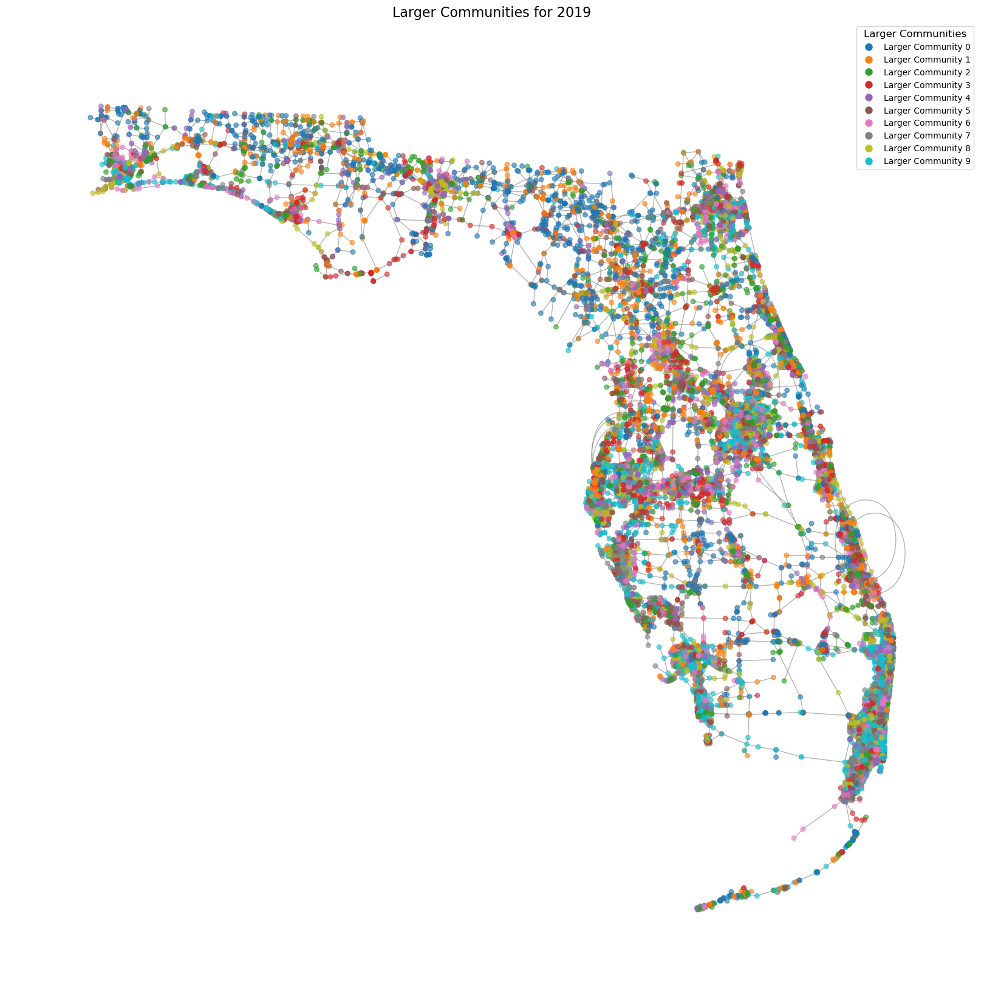

In [221]:
# Example Usage
selected_year = 2019
subgraph = get_subgraph_for_year(G, selected_year)
communities = detect_communities_louvain(subgraph, weight='AADT', resolution=0.01)
subgraph.remove_edges_from(nx.selfloop_edges(subgraph)) 

# Analyze AADT by community
community_stats = analyze_aadt_by_community(subgraph, communities)

# Regroup into 10 larger communities
n_larger_groups = 10
larger_community_mapping = regroup_communities(community_stats, n_groups=n_larger_groups)

# Plot the 10 larger communities
plot_larger_communities(
    subgraph, communities, larger_community_mapping, n_groups=n_larger_groups,
    title=f"Larger Communities for {selected_year}"
)

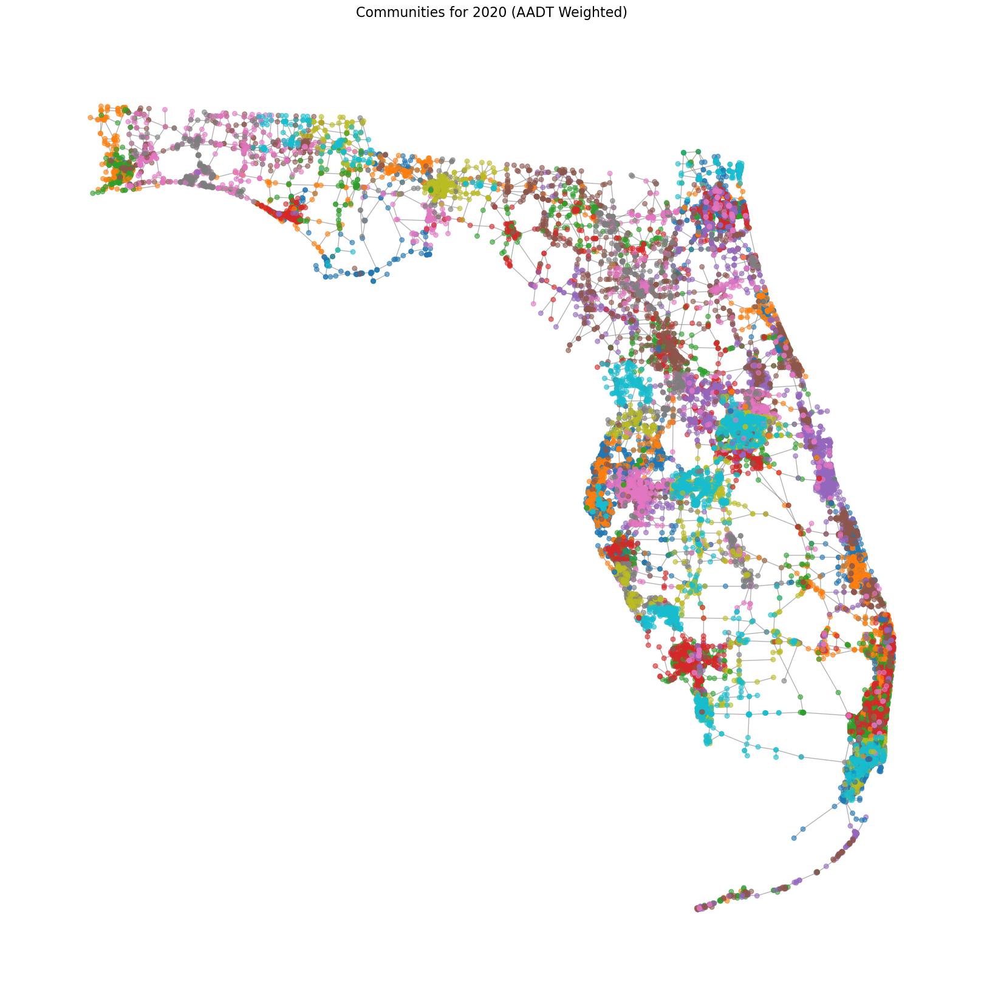

Community AADT Analysis (Ranked by Mean AADT):
Community 2596: Mean AADT = 255583.33, Median AADT = 296000.00, Max AADT = 296000, Min AADT = 116500, Total AADT = 1533500, Edges = 6
Community 1047: Mean AADT = 233250.00, Median AADT = 250000.00, Max AADT = 250000, Min AADT = 181000, Total AADT = 1866000, Edges = 8
Community 2700: Mean AADT = 221500.00, Median AADT = 233000.00, Max AADT = 233000, Min AADT = 210000, Total AADT = 2215000, Edges = 10
Community 2603: Mean AADT = 217266.75, Median AADT = 222000.00, Max AADT = 222567, Min AADT = 197000, Total AADT = 1738134, Edges = 8
Community 7056: Mean AADT = 215800.00, Median AADT = 209000.00, Max AADT = 247000, Min AADT = 157000, Total AADT = 2158000, Edges = 10
Community 1220: Mean AADT = 211187.50, Median AADT = 215000.00, Max AADT = 220000, Min AADT = 183500, Total AADT = 1689500, Edges = 8
Community 2079: Mean AADT = 210000.00, Median AADT = 210000.00, Max AADT = 210000, Min AADT = 210000, Total AADT = 420000, Edges = 2
Community 2185

In [218]:
communities_low_res = detect_communities_louvain(subgraph, weight='AADT', resolution=100)

plot_communities(subgraph, communities_low_res, title=f"Communities for {selected_year} (AADT Weighted)")

# Analyze AADT by community
community_stats = analyze_aadt_by_community(subgraph, communities_low_res)

total_communities = len(community_stats)
print(f"Total number of communities: {total_communities}")

In [222]:
def regroup_communities_by_aadt_ranges(community_stats, ranges):
    """
    Regroups communities into groups based on specified Mean AADT ranges.
    Parameters:
        community_stats: Dictionary with community stats, including 'mean_aadt'.
        ranges: List of tuples defining (min, max) for Mean AADT.
    Returns:
        A dictionary mapping original community IDs to new group IDs.
    """
    regrouped_mapping = {}
    for cid, stats in community_stats.items():
        mean_aadt = stats['mean_aadt']
        for group_id, (min_aadt, max_aadt) in enumerate(ranges):
            if min_aadt <= mean_aadt <= max_aadt:
                regrouped_mapping[cid] = group_id
                break
    return regrouped_mapping

In [227]:
def plot_custom_larger_communities(G, communities, larger_community_mapping, ranges, title="Larger Communities by Mean AADT"):
    """
    Plots the graph with nodes colored by larger community group based on AADT ranges.
    Parameters:
        G: The input graph.
        communities: A dictionary mapping nodes to community IDs.
        larger_community_mapping: Mapping of original community IDs to larger groups.
        ranges: List of Mean AADT ranges.
        title: Title of the plot.
    """
    # Reassign nodes to larger communities, assigning unassigned nodes to a default group
    default_group = len(ranges)  # A group ID for unassigned nodes
    larger_communities = {
        node: larger_community_mapping.get(communities.get(node, default_group), default_group)
        for node in G.nodes()
    }
    
    # Assign colors to larger communities
    node_colors = [larger_communities[node] for node in G.nodes()]
    cmap = plt.cm.get_cmap('tab10', len(ranges) + 1)  # Add one for the default group
    
    # Plot the graph
    pos = {node: node for node in G.nodes()}  # Node positions (coordinates)
    plt.figure(figsize=(16, 16))
    nx.draw(
        G, pos,
        node_color=node_colors,
        with_labels=False,
        node_size=30,
        cmap=cmap,
        edge_color="gray",
        alpha=0.6
    )
    
    # Add legend
    legend_elements = [
        plt.Line2D(
            [0], [0],
            marker='o',
            color='w',
            markerfacecolor=cmap(i / (len(ranges) + 1)),
            markersize=10,
            label=f"{min_aadt}-{max_aadt}" if i < len(ranges) else "Unassigned"
        )
        for i, (min_aadt, max_aadt) in enumerate(ranges + [(None, None)])
    ]
    plt.legend(
        handles=legend_elements,
        loc='best',
        title="Mean AADT Ranges",
        fontsize=10,
        title_fontsize=12
    )
    
    plt.title(title, fontsize=16)
    plt.show()


C:\Users\TeoDea\AppData\Local\Temp\ipykernel_60224\391070084.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab10', len(ranges) + 1)  # Add one for the default group


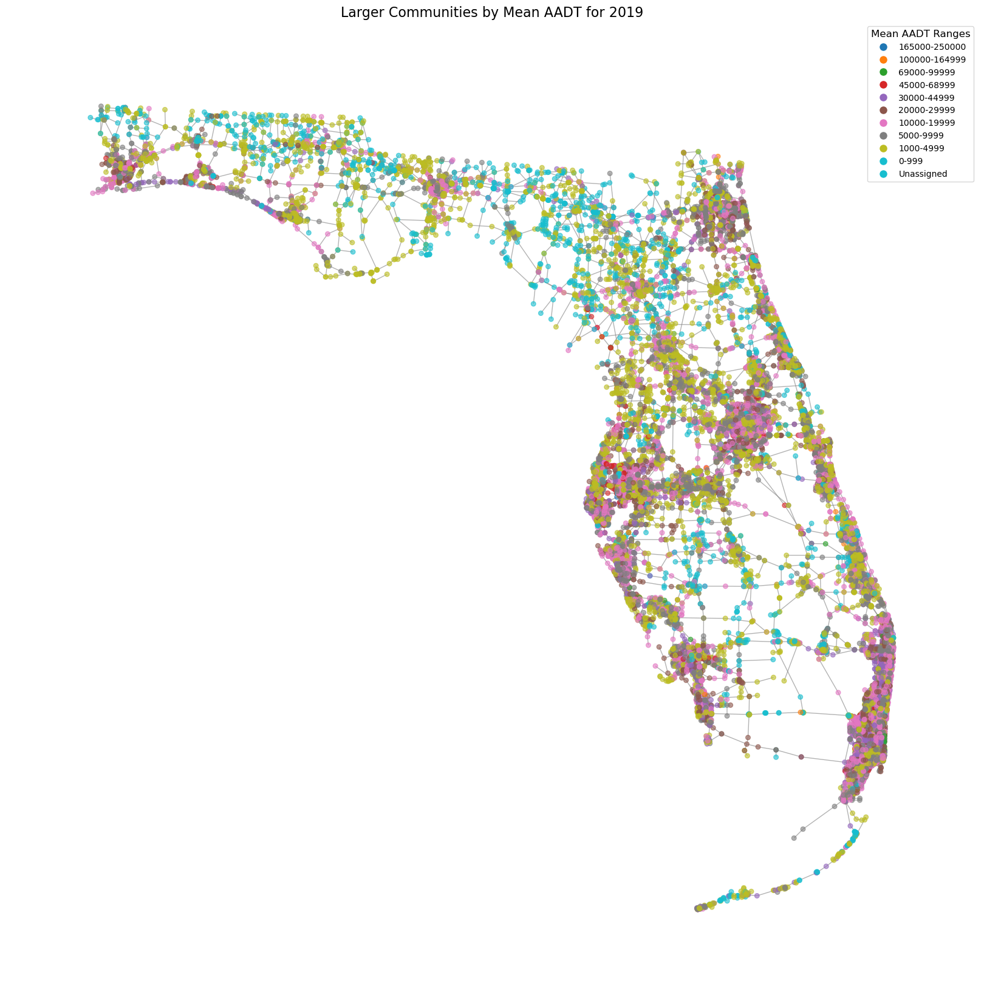

In [228]:
# Example Usage
selected_year = 2019
subgraph = get_subgraph_for_year(G, selected_year)
subgraph.remove_edges_from(nx.selfloop_edges(subgraph)) 
communities = detect_communities_louvain(subgraph, weight='AADT')

# Analyze AADT by community
community_stats = analyze_aadt_by_community(subgraph, communities)

# Define Mean AADT ranges
mean_aadt_ranges = [
    (165000, 250000), (100000, 164999), (69000, 99999), (45000, 68999),
    (30000, 44999), (20000, 29999), (10000, 19999), (5000, 9999), 
    (1000, 4999), (0, 999)
]

# Regroup communities
larger_community_mapping = regroup_communities_by_aadt_ranges(community_stats, mean_aadt_ranges)

# Plot
plot_custom_larger_communities(
    subgraph, communities, larger_community_mapping, mean_aadt_ranges,
    title=f"Larger Communities by Mean AADT for {selected_year}"
)
